# **Deep Learning Homework 6: *Variational Autoencoders***
### MSc Computer Science, Data Science, Cybersecurity Computer Engeneering @UniPD
### 2nd semester - 6 ECTS
### Prof. Alessandro Sperduti, Prof. Nicolò Navarin & Dr. Luca Pasa
---

In this homework, we will explore how to develop a Variational Autoencoder (VAE). We will define a Variational Autoencoder starting from basic PyTorch components. Then, we will define a training loop which includes the two losses used to train VAEs, namely the reconstruction loss and the KL-divergence loss.
Using this training loop, we will fit the model on the MNIST dataset choosing  appropriate hyperparameters. Finally, we will and explore and analyze the latent encodings learned by the model thanks to some visualization techniques.

**NOTE**: in order to run this notebook without problems, please connect to a *GPU runtime*. You can do so by clicking on the RAM / Disk icon in the upper right part of the notebook, then on *Change runtime type* at the bottom of the page, and then select the GPU hardware accelerator.


#Requirements

In [ ]:
!pip3 install datasets skorch pandas~=1.5 torch~=1.13 torchinfo torchdata~=0.5 torchtext~=0.14 torchvision~=0.14 torchaudio~=0.13

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 474.6/474.6 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 210.0/210.0 kB 20.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 887.5/887.5 MB 1.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 73.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.5/212.5 kB 15.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.3/134.3 kB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 34.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.8/236.8 kB 19.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 849.3/849.3 kB 55.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 557.1/557.1 MB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━

#Imports

In [ ]:
import torch
from torch import nn
import torch.nn.functional as F
import torchvision.datasets as datasets
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from torchinfo import summary
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from timeit import default_timer as timer
import warnings
warnings.filterwarnings("ignore")

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

#Data Loading and Preprocessing

We load the MNIST dataset. The dataset contains 60,000 training grayscale images and 10,000 testing image of handwritten digits. We chose to use a 128-dimensional batch in order to make the training process reasonably fast -- you should thus leave this value unchanged.

In [ ]:
Trns = transforms.ToTensor()
def preprocess(img):
  img = Trns(img)
  H, W = img.shape[1:]
  img = img.reshape((H*W, ))
  return img

MNIST = datasets.MNIST(root='./data', train=True, download=True, transform=preprocess)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



In [ ]:
batch_size = 128
dataloader = DataLoader(MNIST, batch_size=batch_size, shuffle=True)

Let us see one of the digits:

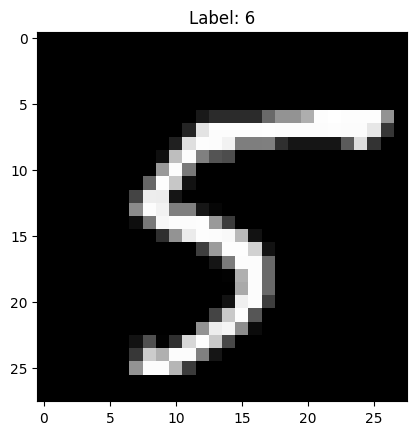

In [ ]:
data_iter = iter(dataloader)
images, labels = next(data_iter)

plt.imshow(images[0].reshape(28,28), cmap='gray')
plt.title(f"Label: {labels[0]+1}")
plt.show()

#[TO COMPLETE] VAE Architecture

###Exercise 6.1: Variational Autoencoder: reparameterization trick
To implement a VAE we have to define two main parts: the _Encoder_ and the _Decoder_.
Let's start by the Encoder, that computes an encoding of the input from which it computes the mean and the average of the sample distribution.
Once we have these two statistics, we have to implement the sampling phase. Keras does not provide any predefined method to perform this operation, therefore we have to define it. With the aim to be consistent with the layer-composition paradigm used by Keras in defining a model, we define a Sampling layer as a new layer.

In our case, the Sampling layer has in input the tuple made of the mean and the log-variance, and it has to compute the sample $z$ from them by exploiting the reparameterization trick:
$$
z=z_{mean} + exp(z_{var}/2) * \epsilon
$$
The reparameterization trick is used in VAE because it actually helps in the backpropagation process. Specifically, $\epsilon \sim \mathcal{N}(0,1)$ actually reparameterizes our VAE network. This allows the mean and log-variance vectors to still remain as the learnable parameters of the network while  maintaining the stochasticity of the entire system via epsilon.


As usual, we will provide the structure of the implementation of the VAE in PyTorch. The Encoder and Decoder are embodied by the `E_layers` and `D_layers` respectively.<br>

<br>

**[TO COMPLETE]** Complete the code of the VAE model defining:

1. the dense layers that model `z_mean` and `z_var`
2. the sampling function that implements the reparametrization trick
3. the reparameterization trick in the forward function.

*Hint*: to generate random values from a normal distribution you can use the PyTorch [torch.randn](https://pytorch.org/docs/stable/generated/torch.randn.html) function, and make sure the output shape is the proper one.


`%STARTCODE%`

In [ ]:
class VAE(nn.Module):
  def __init__(self, input_dim, ENC_LAYERS, latent_dim, DEC_LAYERS, act_fun, last_layer_act_fun):
    super().__init__()
  
    self.E_layers = nn.ModuleList()
    self.D_layers = nn.ModuleList()
    self.latent_dim = latent_dim

    activation_functions = {'linear':transforms.Lambda(lambda x: x), 'sigmoid':F.sigmoid, 'relu':F.relu, 'tanh': F.tanh, 'leaky_relu': F.leaky_relu}
    assert act_fun in activation_functions, f'Activation Functions: {activation_functions.keys()}'
    self.af = activation_functions[act_fun]
    self.last_af = activation_functions[last_layer_act_fun]

    for layer_idx in range(len(ENC_LAYERS)):
      if layer_idx == 0:  # first layer, from input to enc
        self.E_layers = self.E_layers.append(nn.Linear(input_dim, ENC_LAYERS[layer_idx]))
      else:  # hidden layers, depending on the input
        self.E_layers = self.E_layers.append(nn.Linear(ENC_LAYERS[layer_idx-1], ENC_LAYERS[layer_idx]))
    
    ### TO COMPLETE
    # 1. define the dense layers that model z_mean and z_var
    self.linear_mean = nn.Linear(ENC_LAYERS[-1], self.latent_dim) # [your code here]
    self.linear_var  = nn.Linear(ENC_LAYERS[-1], self.latent_dim) # [your code here]
    ###

    if len(DEC_LAYERS) == 0:
      self.D_layers = self.D_layers.append(nn.Linear(ENC_LAYERS[-1], input_dim))
    else:
      for layer_idx in range(len(DEC_LAYERS)):
        if layer_idx == 0:  # first layer, from enc to dec
          self.D_layers = self.D_layers.append(nn.Linear(latent_dim, DEC_LAYERS[layer_idx]))
        else:  # hidden layers, depending on the input
          self.D_layers = self.D_layers.append(nn.Linear(DEC_LAYERS[layer_idx-1], DEC_LAYERS[layer_idx]))

    self.final_fc = nn.Linear(DEC_LAYERS[-1], input_dim)
  
  def sampling(self, z_mean, z_var):
    ### TO COMPLETE
    # 2. write the sampling function that implements the reparametrization trick
    eps = torch.randn_like(z_mean)
    std = torch.exp(0.5*z_var)
    z = eps.mul(std).add_(z_mean) # or just # [your code here]
    return z
    ###

  def encode(self, x):
    """This function implmements the encoder part of our VAE.
    It will also be useful to explore the latent space learned after training!
    """
    for layer in self.E_layers:
      x = self.af(layer(x))
    return x

  def decode(self, z):
    """This function implmements the decoder part of our VAE.
    It will also be useful to explore the latent space learned after training!
    """
    for layer in self.D_layers:
      z = self.af(layer(z))
    
    out = self.final_fc(z)

    return self.last_af(out)
  
  def forward(self, x):
    x = self.encode(x)

    ### TO COMPLETE
    # 3. use the linear layers and the sampling function you defined above
    # to compute the sample z
    # [your code here]
    self.z_mean = self.linear_mean(x)
    self.z_var = self.linear_var(x)
    self.z = self.sampling(self.z_mean, self.z_var) # [your code here]
    ###

    return self.decode(self.z)

`%ENDCODE%`



#[TO COMPLETE] Loss Functions

Now we have defined the VAE but, since it is a generative model, we have to define an ad-hoc training phase. Specifically, we have to manage the two losses used for this model. Indeed the parameters of a VAE are trained via two loss functions: a reconstruction loss, that forces the decoded samples to match the initial inputs, and a regularization loss that helps to learn  a well-formed latent space, and to reduce overfitting. The regularization loss is handled with the _Kullback-Liebler Divergence_. On the other hand, for the reconstruction loss we will use the _binary cross-entropy_ to compare each feature of a data point to the value in the reconstructed output.

**[TO COMPLETE]**: Implement the reconstruction loss and the KL-divergence.

*Disclaimer*: To implement the reconstruction loss you can use function or classes already available in PyTorch, while you must implement the KL-divergence from scratch, explointing the attributes in the `VAE` class.

`%STARTCODE%`

In [ ]:
#let's define the reconstruction loss...
REC_LOSS = nn.BCELoss() ### TO COMPLETE 

#..and the Kullback-Liebler Divergence
def KL_LOSS(model):
  ### TO COMPLETE
  mu = model.z_mean
  sigma = model.z_var 
  loss = torch.mean(-0.5 * torch.sum(1 + sigma - torch.square(mu) - torch.exp(sigma), dim=1), dim=0)
  return loss
  ###

`%ENDCODE%`

**Comment**:

The forward() method computes z_mean and z_var as tensors of dimension (batch_size=128, latent_dim=2) each.

In the definition of the loss functions, we could either go for:

1. Sum of the loss for the whole batch:


    REC_LOSS = nn.BCELoss(reduction='sum')

    def KL_LOSS(model):
      mu = model.z_mean
      sigma = model.z_var 
      loss = -0.5 * torch.sum(1 + sigma - mu.pow(2) - sigma.exp())  
      return loss   

In this approach the loss is summed over the entire batch.

2. Mean of loss for each batch:


      REC_LOSS = nn.BCELoss()

      def KL_LOSS(model):
        mu = model.z_mean
        sigma = model.z_var 
        loss = torch.mean(-0.5 * torch.sum(1 + sigma - mu.pow(2) - sigma.exp(), dim=1), dim=0)

Without specifying the reduction in BCELoss(), the reconstruction loss is averaged (mean reduction) over the batch. Similary in KL_LOSS we have to compute the mean loss across the batch dimension (dimension 1) for each sample in the batch. This approach is better suited when the batch size varies, and we would like to compare between models. 

#[TO COMPLETE] Training

We define the training loop. Notice how we set a $\beta$ parameter to weight the combination of the two losses. 

In [ ]:
def train(model, optimizer, dataloader, epochs, Beta=1e-3):
  loss_train_rec, loss_train_kl, loss_train = [], [], []

  for epoch in range(epochs):
    model.train()
    n_train_batches, rec_train, kl_train, total_loss_train = 0, 0, 0, 0

    for idx, (img, _) in enumerate(dataloader):
      # reset the gradient for all parameters
      optimizer.zero_grad()
      
      # move the input to currently used device
      img = img.to(device)

      # run the model
      rec_img = model(img)
      
      # compute the loss for this sample
      rec_loss = REC_LOSS(rec_img, img)
      kl_loss = KL_LOSS(model)
      total_loss = rec_loss + Beta * kl_loss

      # accumulate the loss for this epoch
      total_loss_train += total_loss
      rec_train += rec_loss
      kl_train += kl_loss

      # compute the gradients and update weights
      total_loss.backward()
      optimizer.step()

      n_train_batches += 1

    # compute losses for this epoch
    avg_loss_train = total_loss_train/n_train_batches
    avg_rec_loss_train = rec_train/n_train_batches
    avg_kl_loss_train = kl_train/n_train_batches

    # store losses
    loss_train.append(avg_loss_train.item())
    loss_train_rec.append(avg_rec_loss_train.item())
    loss_train_kl.append(avg_kl_loss_train.item())

    if epoch % 1 == 0:
      print(f"epoch: {epoch+1} -> Loss: {avg_loss_train:.8f}", end=' ----- ')
      print(f"Rec Loss: {avg_rec_loss_train:.8f}", end=' ----- ')
      print(f"Effective KL Loss: {Beta * avg_kl_loss_train:.8f}")

  return loss_train, loss_train_rec, loss_train_kl

In [ ]:
def plot_losses(loss_train, loss_rec, loss_kl):
  plt.subplot(2, 1, 1)
  plt.grid(True)
  plt.title("Reconstruction Loss")
  plt.plot(loss_rec)
  plt.xlabel("Epochs")
  plt.ylabel("Loss")
  plt.show()

  print("\n")

  plt.subplot(2, 1, 2)
  plt.title("KL Loss")
  plt.grid(True)
  plt.plot(loss_kl)
  plt.xlabel("Epochs")
  plt.ylabel("Loss")
  plt.show()

**[TO COMPLETE]:** 
Your task is to make the VAE working well and learn the digits'representstions. Define the hyperparameters for the encoder and decoder layers. Explain choice for what concerns the number of layers, the layers sizes, and the activation functions in the cells below.

_Hint:_ Note that we should define the `latent_dim` (that is the dimension of $z$) to $2$. This choice is made to make possible to represent the results graphically.
Pay attention to the relation between the decoding and encoding layers.

`%STARTCODE%`

In [ ]:
### TO COMPLETE
# ENC_LAYERS and DEC_LAYERS should be lists describing the number and size of 
# encoding / decoding layers
input_dim = 784 ###TO COMPLETE
ENC_LAYERS =  [512, 256, 32] ###TO COMPLETE
latent_dim = 2
DEC_LAYERS =  [16, 256, 512] ###TO COMPLETE
act_fun =  'relu' ###TO COMPLETE
last_layer_act_fun = 'sigmoid' ###TO COMPLETE
###

vae = VAE(input_dim, ENC_LAYERS, latent_dim, DEC_LAYERS, act_fun, last_layer_act_fun).to(device)
summary(vae, input_size=(input_dim, ))

Layer (type:depth-idx)                   Output Shape              Param #
VAE                                      [784]                     --
├─ModuleList: 1-1                        --                        --
│    └─Linear: 2-1                       [512]                     401,920
│    └─Linear: 2-2                       [256]                     131,328
│    └─Linear: 2-3                       [32]                      8,224
├─Linear: 1-2                            [2]                       66
├─Linear: 1-3                            [2]                       66
├─ModuleList: 1-4                        --                        --
│    └─Linear: 2-4                       [16]                      48
│    └─Linear: 2-5                       [256]                     4,352
│    └─Linear: 2-6                       [512]                     131,584
├─Linear: 1-5                            [784]                     402,192
Total params: 1,079,780
Trainable params: 1,079,780
Non-tra

Let's train out model:

In [ ]:
lr = 1e-3
epochs = 30

optimizer = torch.optim.Adam(vae.parameters(), lr=lr)

In [ ]:
start = timer()
loss_train, loss_rec, loss_kl = train(vae, optimizer, dataloader, epochs)
end = timer()
print(f"Training time in second: {(end - start)}")

epoch: 1 -> Loss: 0.24454461 ----- Rec Loss: 0.24117830 ----- Effective KL Loss: 0.00336616
epoch: 2 -> Loss: 0.20602472 ----- Rec Loss: 0.20044732 ----- Effective KL Loss: 0.00557740
epoch: 3 -> Loss: 0.19502008 ----- Rec Loss: 0.18889605 ----- Effective KL Loss: 0.00612408
epoch: 4 -> Loss: 0.18950103 ----- Rec Loss: 0.18316664 ----- Effective KL Loss: 0.00633445
epoch: 5 -> Loss: 0.18637925 ----- Rec Loss: 0.17992635 ----- Effective KL Loss: 0.00645295
epoch: 6 -> Loss: 0.18396044 ----- Rec Loss: 0.17739667 ----- Effective KL Loss: 0.00656403
epoch: 7 -> Loss: 0.18193071 ----- Rec Loss: 0.17529504 ----- Effective KL Loss: 0.00663556
epoch: 8 -> Loss: 0.18056607 ----- Rec Loss: 0.17387350 ----- Effective KL Loss: 0.00669260
epoch: 9 -> Loss: 0.17956850 ----- Rec Loss: 0.17282675 ----- Effective KL Loss: 0.00674171
epoch: 10 -> Loss: 0.17917125 ----- Rec Loss: 0.17239243 ----- Effective KL Loss: 0.00677887
epoch: 11 -> Loss: 0.17817321 ----- Rec Loss: 0.17132129 ----- Effective KL Los

`%ENDCODE%`

`%STARTEXT`

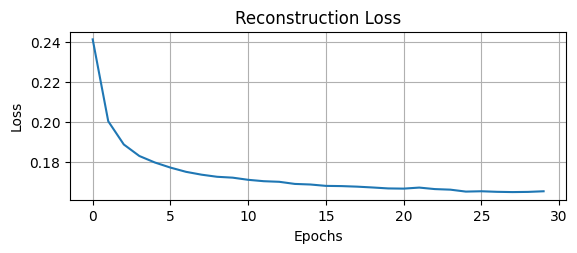

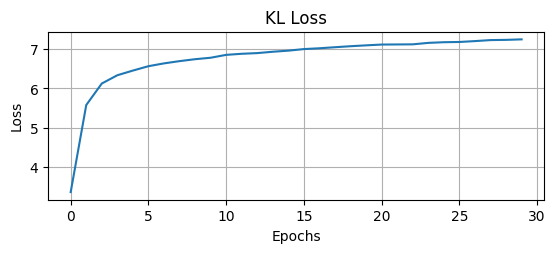

In [ ]:
plot_losses(loss_train, loss_rec, loss_kl)

**[TO COMPLETE]** Comment on your choice of number of layers, the layers sizes, and the activation functions.

Answer: 

* input_dim = 784: This was a pretty straightforward choice. I checked the shape of images[0] and obtained the input dimensions. The total number of pixels for an image in the MNIST dataset is 784 = 28x28.

*  ENC_LAYERS = [512, 256, 32]: I experimented with decreasing sequences of varying lengths (2, 3, 4 layers) and values. The decreasing size allows the network to gradually extract higher-level features and compress the input into a lower-dimensional latent space. *I noticed that smaller last layers yielded better results.*

*  DEC_LAYERS = [16, 256, 512]: I chose these values to (almost) mirror the architecture of the encoder, in reverse order. By doing this, we end up with 784 output features, which matches the dimensionality of the input.

*  act_fun = 'relu': I chose ReLU as the most popular non-linear activation function, in order to help capture complex non-linear patterns in the data.

*  last_layer_act_fun = 'sigmoid': I chose the sigmoid function because it ensures that the reconstructed output of the VAE falls within the valid pixel intensity range of a grayscale image, which is [0, 1].



`%ENDTEXT`

#[TO COMPLETE] Generation

The best part about generative models is that they can generate new data (ChatGPT is pretty good at it 🙃). We can therefore plot an example of the data generation by using the decoder part. Since we used a 2D latent space let's generate sevral possibile 2D $\hat{z}$ samples and pass them to our decoder. With the $scale$ parameter we can define the interval from where the entries of $\hat{z}$ are chosen, and with parameter $n$ it is possibile to define how many samples are generated.  

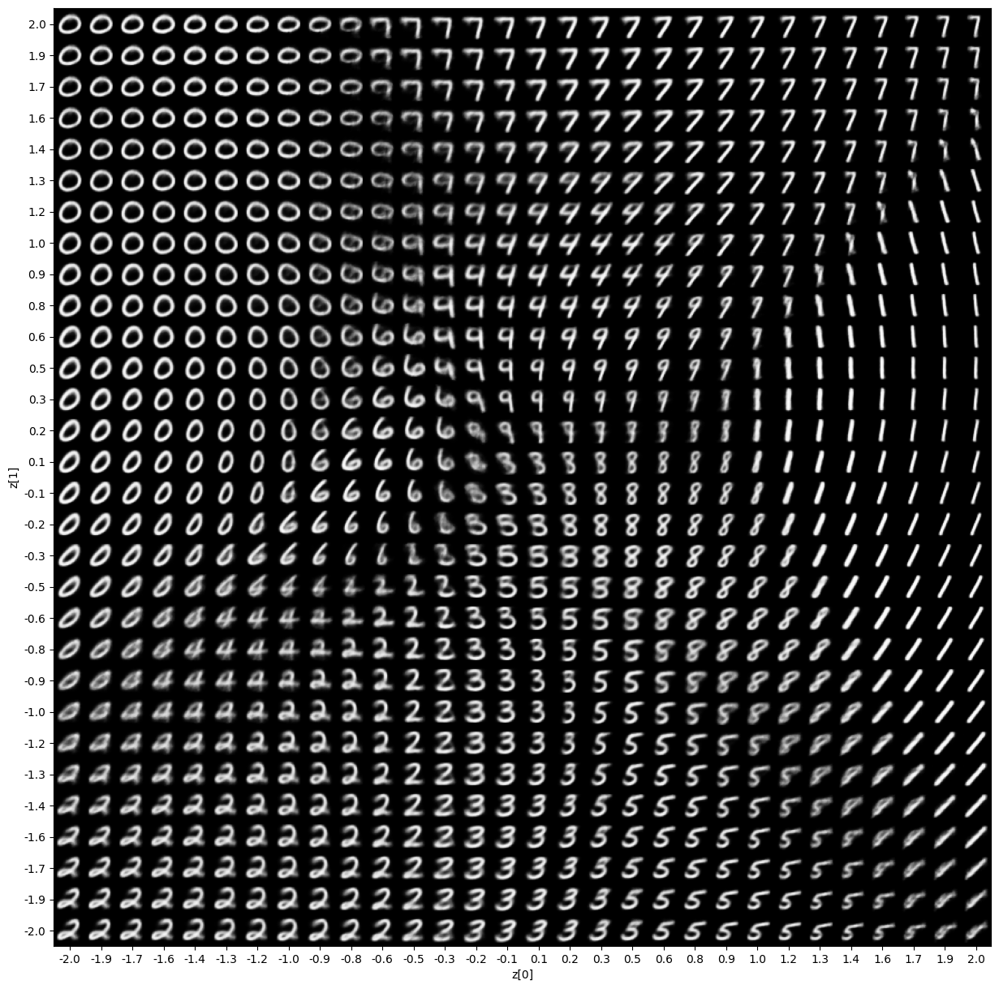

In [ ]:
def plot_latent(scale=2.0, n = 30):
     
    digit_size = 28
    figsize = 15
    figure = np.zeros((digit_size * n, digit_size * n))

    # here we systematically generate 2D samples of z_hat...
    grid_x = np.linspace(-scale, scale, n)
    grid_y = np.linspace(-scale, scale, n)[::-1]

    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            # ...we cast and reshape the samples
            z_sample = torch.tensor([[xi, yi]], dtype=torch.float32).to(device)
            # ...and then we pass them to the decoder, 
            # without keeping track of the gradient
            with torch.no_grad():
              x_decoded = vae.decode(z_sample)
            digit = x_decoded[0].reshape(digit_size, digit_size).to('cpu')
            figure[
                i * digit_size : (i + 1) * digit_size,
                j * digit_size : (j + 1) * digit_size,
            ] = digit

    # Finally we plot the generated data
    plt.figure(figsize=(figsize, figsize))
    start_range = digit_size // 2
    end_range = n * digit_size + start_range
    pixel_range = np.arange(start_range, end_range, digit_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)

    plt.xticks(pixel_range, sample_range_x)
    plt.yticks(pixel_range, sample_range_y)
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.imshow(figure, cmap="Greys_r")
    plt.show()


plot_latent(2.0, 30) 

The final result is quite impressive, considering that all these digits are artificial and they not belong to any dataset!
Let's finally check how the various digits have been represented in the latent space by the VAE.

In [ ]:
x_train, y_train = next(iter(DataLoader(MNIST, batch_size=len(MNIST))))

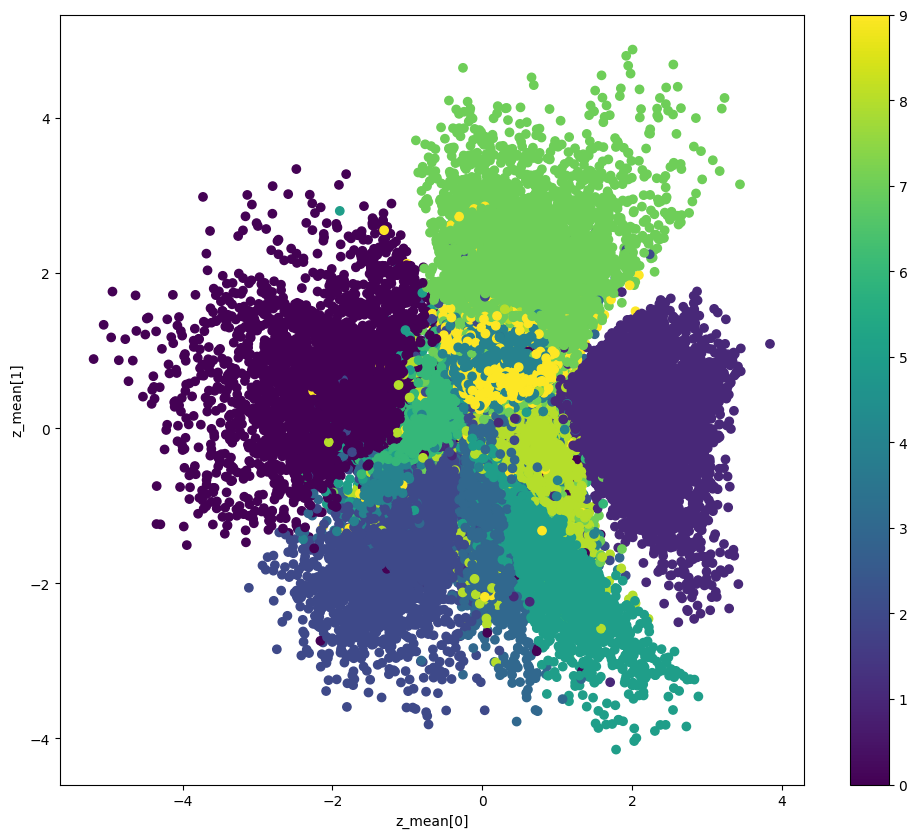

In [ ]:
def plot_label_clusters(data, labels):
    with torch.no_grad():
      # let's compute the encodings 
      encoding = vae.encode(data.to(device))
      # and then the mean used in the reparameterization trick
      z_mean = vae.linear_mean(encoding).to('cpu')
    
    # Let's plot the latent space
    plt.figure(figsize=(12, 10))
    plt.scatter(z_mean[:, 0], z_mean[:, 1], c=labels)
    plt.colorbar()
    plt.xlabel("z_mean[0]")
    plt.ylabel("z_mean[1]")
    plt.show()

plot_label_clusters(x_train, y_train)

**[TO COMPLETE]** Explore how the hyper-parameters of the VAE (number of layers, layer sizes, etc.) influence the final result. Discuss the obtained plots, and different hyperparameters you have tried. Insert your discussion below:

`%STARTEXT`

Answer: 

There is a clear connection between the last two plots: the label clusters and the plot latent. In the label clusters plot, we can see that samples representing the same/similar digits tend to be grouped together, forming clusters, while the dissimilar digits exist in different regions, smoothly transitioning from one digit to another. It's interesting to note that larger clusters in the label clusters plot correspond to a greater number of points in the plot latent. This makes sense because when we generate the 30x30 samples using the VAE decoder, some digits are more likely to appear, resulting in larger clusters and more frequent occurrences in the plot latent.

I performed several experiments by modifying the number of layers in the encoder (ENC_LAYERS) and decoder (DEC_LAYERS) of the VAE. Here are the configurations I tested, along with the results and the findings from them:


    ENC_LAYERS =  [512, 256, 128, 64]
    DEC_LAYERS =  [64, 128, 256, 512]
* epoch: 30 -> Loss: 0.17484361 ----- Rec Loss: 0.16745889 ----- Effective KL Loss: 0.00738465
* Training time in second: 1074.7584243100002
* Digits: 0 1 2 3 4 5 7 8 9 -> Unable to generate the digit 6; The clusters overlap a lot in the middle.


    ENC_LAYERS =  [256, 128, 64, 32]
    DEC_LAYERS =  [32, 64, 128, 256]
* epoch: 30 -> Loss: 0.17849748 ----- Rec Loss: 0.17131148 ----- Effective KL Loss: 0.00718601
* Training time in second: 341.2541062800001
* Digits: 0 1 2 3 4 5 6 7 8 9 -> Has problems in generating the digit 5 (it's overlapping with 3, 8); There're two big clusters (1 and 7).


    ENC_LAYERS =  [512, 256, 128]
    DEC_LAYERS =  [128, 256, 512]
* epoch: 30 -> Loss: 0.17135482 ----- Rec Loss: 0.16409287 ----- Effective KL Loss: 0.00726198 
* Training time in second: 323.0045237930001
* Digits: 0 1 2 3 4 5 6 7 8 9 -> There're 4 big clusters; **In my opinion, it has better performance than the previous models with 4 layers.**


    ENC_LAYERS =  [512, 256, 32]
    DEC_LAYERS =  [16, 256, 512]
* epoch: 30 -> Loss: 0.17167954 ----- Rec Loss: 0.16444968 ----- Effective KL Loss: 0.00722978
* Training time in second: 361.89488548799994
* Digits: 0 1 2 3 4 5 6 7 8 9 -> There're almost 10 clusters (**best performance in my opinion**)


    ENC_LAYERS =  [512, 256, 20]
    DEC_LAYERS =  [20, 256, 512]
* epoch: 30 -> Loss: 0.17252988 ----- Rec Loss: 0.16521011 ----- Effective KL Loss: 0.00731974
* Training time in second: 321.40284016299995
* Digits: 0 1 2 3 4 5 6 7 8 9 -> There're 6 big distinct clusters, while other clusters overlap in the middle.


    ENC_LAYERS =  [512, 128, 64]
    DEC_LAYERS =  [64, 128, 512]
* epoch: 30 -> Loss: 0.17375718 ----- Rec Loss: 0.16650601 ----- Effective KL Loss: 0.00725134
* Training time in second: 319.62644382400003 
* Digits: 0 1 2 3 4 5 6 7 8 9 -> There're 8 clusters, while **the other clusters overlap, so we see many blurry digits because of that.**


    ENC_LAYERS =  [256, 128, 32]
    DEC_LAYERS =  [32, 128, 256]
* epoch: 30 -> Loss: 0.17708860 ----- Rec Loss: 0.17003427 ----- Effective KL Loss: 0.00705438
* Training time in second: 326.4363974769999
* Digits: 0 1 2 3 4 5 6 7 8 9 -> There're 3 clusters, other clusters overlap in the mean=0; It struggles in generating the digit 2.


    ENC_LAYERS =  [128, 64, 32]
    DEC_LAYERS =  [32, 64, 128]
* epoch: 30 -> Loss: 0.17813672 ----- Rec Loss: 0.17123355 ----- Effective KL Loss: 0.00690318
* Training time in second: 324.4376374039998
* Digits: 0 1 2 3 5 6 7 8 9 -> There're 3 clusters, other clusters overlap in the mean=0; It's unable to generate the digit 4 (undistinguishable from 9) and has problems generating the digit 3.


    ENC_LAYERS =  [256, 128]
    DEC_LAYERS =  [128, 256] 
* epoch: 30 -> Loss: 0.17629869 ----- Rec Loss: 0.16933039 ----- Effective KL Loss: 0.00696821
* Training time in second: 318.6547685149999
* Digits: 0 1 2 3 4 5 6 7 8 9 -> There're 8 **clusters**, and they **deviate a lot from the mean compared to other models**, other 2 overlap with the others.


    ENC_LAYERS =  [512, 256]
    DEC_LAYERS =  [256, 512]
* epoch: 30 -> Loss: 0.17262073 ----- Rec Loss: 0.16534816 ----- Effective KL Loss: 0.00727260
* Training time in second: 356.22318374199995
* Digits: -> 0 1 2 3 4 5 6 7 8 9 -> There're 4 clusters, other clusters overlap in the mean=0; It has problems in generating the digit 3 (overlaps with 8 and 5).


<br>

Observations:

* Number of layers: Increasing the number of layers didn't improve the model's performance.

* Layer sizes: Higher number of units in the first encoder layer, and lower number of units in the last encoder layer yielded the best results. I followed this as a suggestion by a couple of articles online, and it turned out to be true.

<br>

Below is the code for all the hyperparameter tests I performed. 

`%ENDTEXT`

epoch: 1 -> Loss: 0.24810034 ----- Rec Loss: 0.24531332 ----- Effective KL Loss: 0.00278706
epoch: 2 -> Loss: 0.20601229 ----- Rec Loss: 0.20067349 ----- Effective KL Loss: 0.00533873
epoch: 3 -> Loss: 0.19618711 ----- Rec Loss: 0.19030266 ----- Effective KL Loss: 0.00588443
epoch: 4 -> Loss: 0.19050910 ----- Rec Loss: 0.18428689 ----- Effective KL Loss: 0.00622221
epoch: 5 -> Loss: 0.18659768 ----- Rec Loss: 0.18014662 ----- Effective KL Loss: 0.00645106
epoch: 6 -> Loss: 0.18410414 ----- Rec Loss: 0.17752881 ----- Effective KL Loss: 0.00657541
epoch: 7 -> Loss: 0.18242617 ----- Rec Loss: 0.17573634 ----- Effective KL Loss: 0.00668986
epoch: 8 -> Loss: 0.18091455 ----- Rec Loss: 0.17413592 ----- Effective KL Loss: 0.00677866
epoch: 9 -> Loss: 0.17965883 ----- Rec Loss: 0.17279571 ----- Effective KL Loss: 0.00686331
epoch: 10 -> Loss: 0.17970268 ----- Rec Loss: 0.17280848 ----- Effective KL Loss: 0.00689419
epoch: 11 -> Loss: 0.17779112 ----- Rec Loss: 0.17086458 ----- Effective KL Los

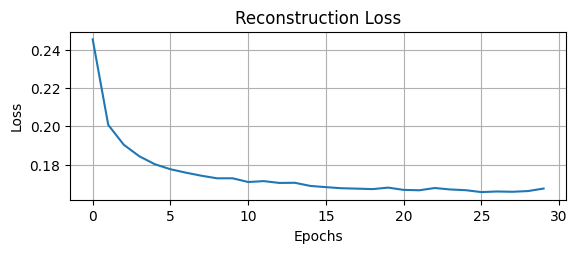

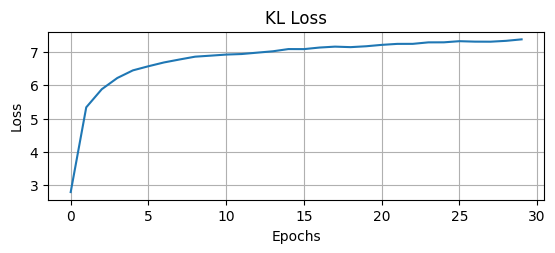

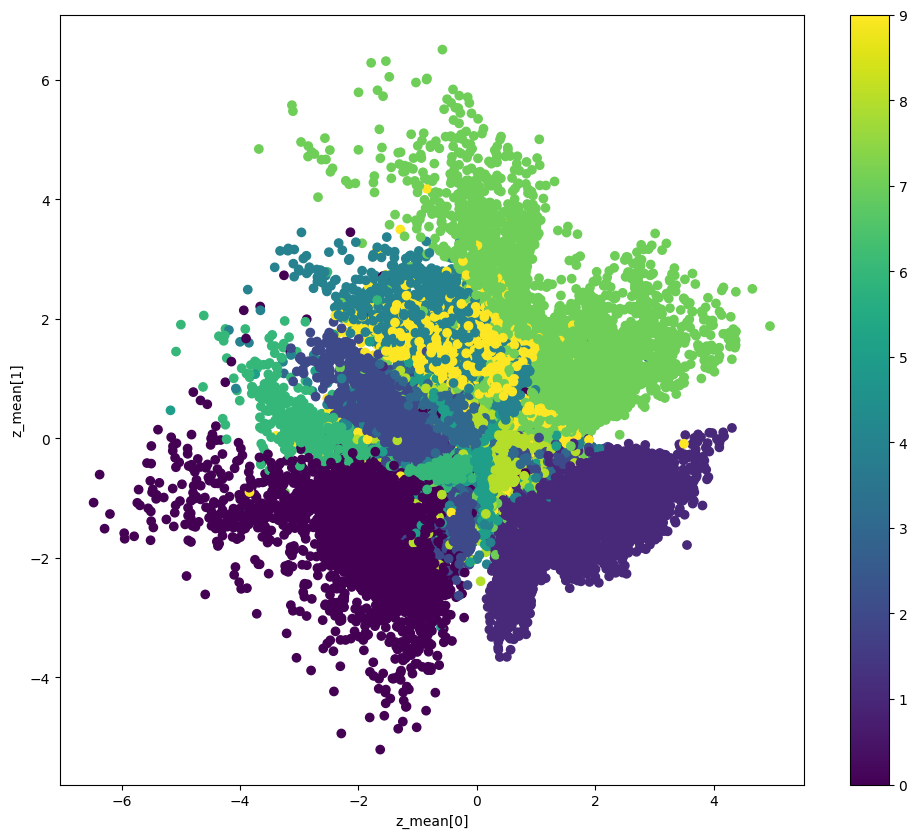

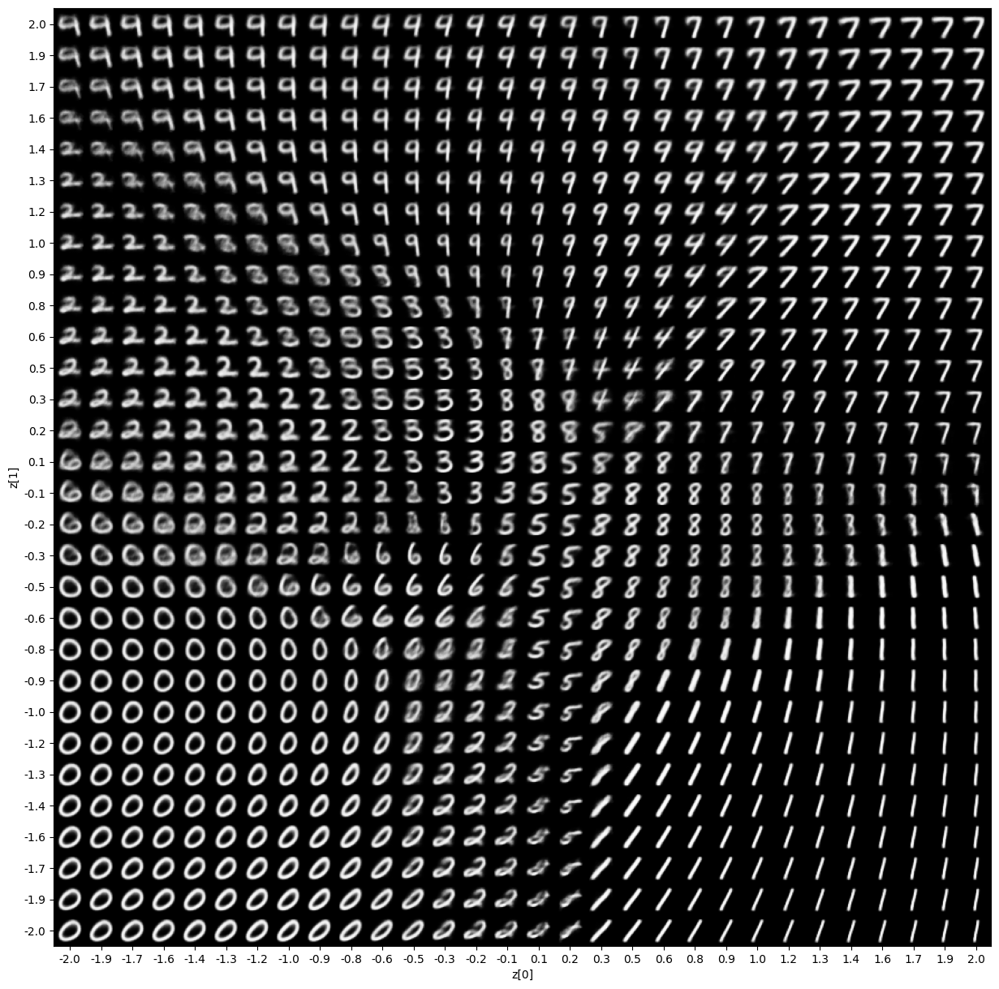

In [ ]:
ENC_LAYERS =  [512, 256, 128, 64]
DEC_LAYERS =  [64, 128, 256, 512]

vae = VAE(input_dim, ENC_LAYERS, latent_dim, DEC_LAYERS, act_fun, last_layer_act_fun).to(device)

optimizer = torch.optim.Adam(vae.parameters(), lr=lr)

start = timer()
loss_train, loss_rec, loss_kl = train(vae, optimizer, dataloader, epochs)
end = timer()
print(f"Training time in second: {(end - start)}")

plot_losses(loss_train, loss_rec, loss_kl)
plot_label_clusters(x_train, y_train)
plot_latent(2.0, 30) 

epoch: 1 -> Loss: 0.26076603 ----- Rec Loss: 0.25845864 ----- Effective KL Loss: 0.00230744
epoch: 2 -> Loss: 0.21926133 ----- Rec Loss: 0.21488616 ----- Effective KL Loss: 0.00437534
epoch: 3 -> Loss: 0.20311756 ----- Rec Loss: 0.19763635 ----- Effective KL Loss: 0.00548139
epoch: 4 -> Loss: 0.19673429 ----- Rec Loss: 0.19091702 ----- Effective KL Loss: 0.00581731
epoch: 5 -> Loss: 0.19275816 ----- Rec Loss: 0.18672518 ----- Effective KL Loss: 0.00603292
epoch: 6 -> Loss: 0.18954025 ----- Rec Loss: 0.18330890 ----- Effective KL Loss: 0.00623130
epoch: 7 -> Loss: 0.18700211 ----- Rec Loss: 0.18060111 ----- Effective KL Loss: 0.00640087
epoch: 8 -> Loss: 0.18498851 ----- Rec Loss: 0.17847539 ----- Effective KL Loss: 0.00651341
epoch: 9 -> Loss: 0.18335252 ----- Rec Loss: 0.17678018 ----- Effective KL Loss: 0.00657236
epoch: 10 -> Loss: 0.18216768 ----- Rec Loss: 0.17552033 ----- Effective KL Loss: 0.00664740
epoch: 11 -> Loss: 0.18163860 ----- Rec Loss: 0.17495441 ----- Effective KL Los

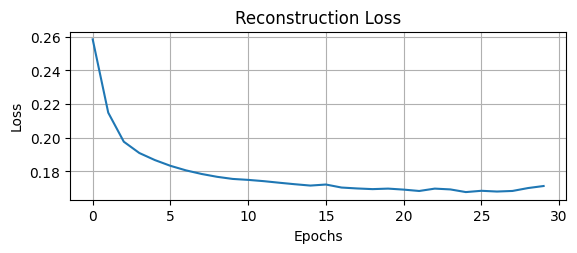

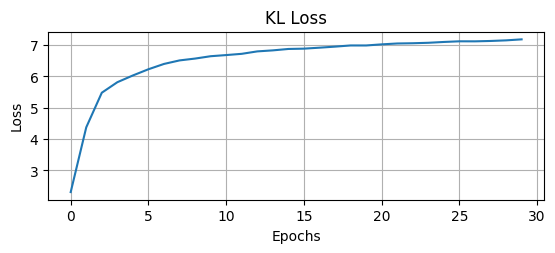

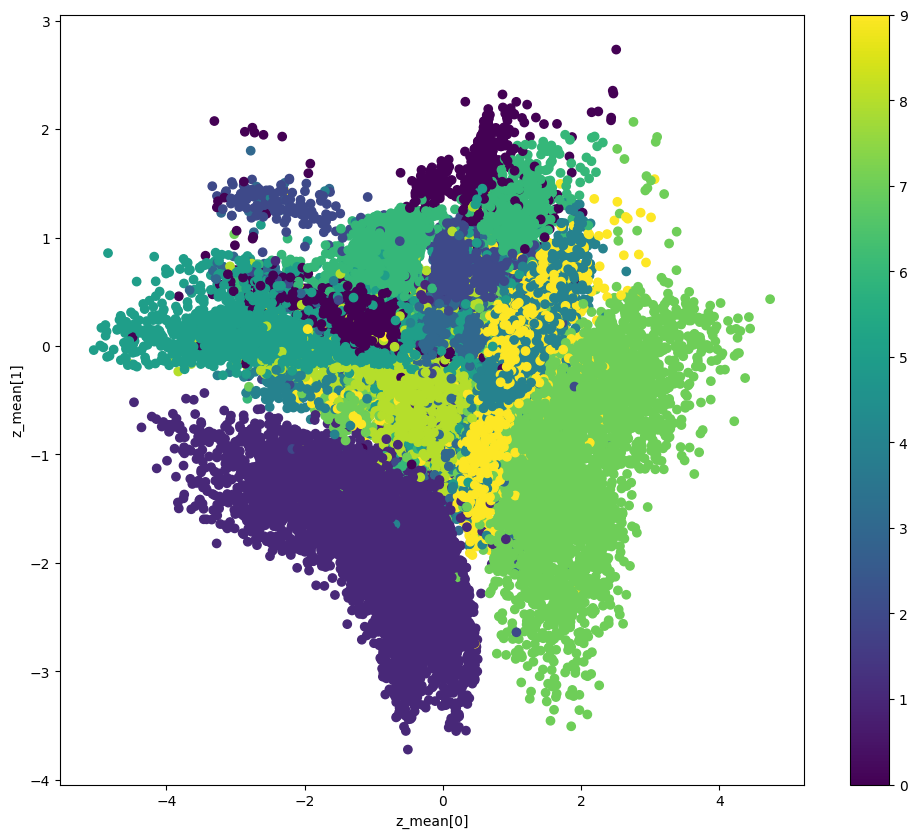

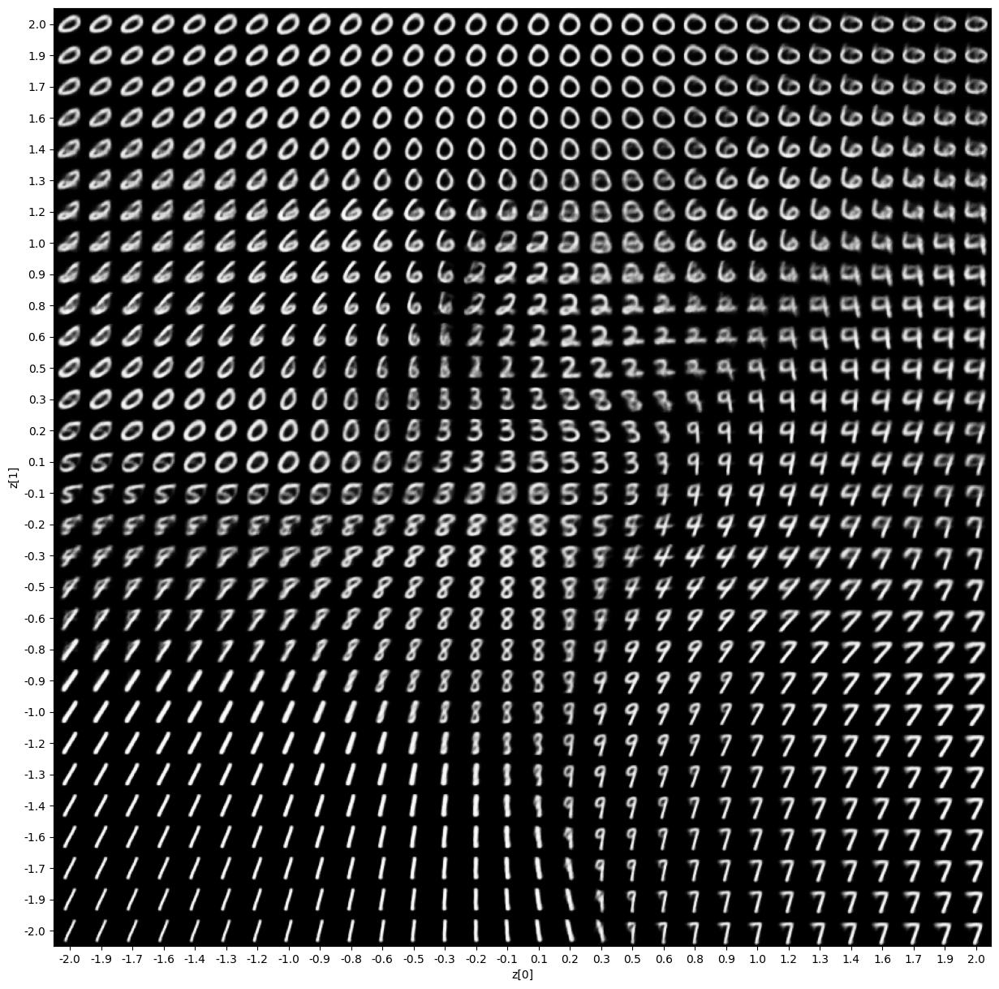

In [ ]:
ENC_LAYERS =  [256, 128, 64, 32]
DEC_LAYERS =  [32, 64, 128, 256]

vae = VAE(input_dim, ENC_LAYERS, latent_dim, DEC_LAYERS, act_fun, last_layer_act_fun).to(device)

optimizer = torch.optim.Adam(vae.parameters(), lr=lr)

start = timer()
loss_train, loss_rec, loss_kl = train(vae, optimizer, dataloader, epochs)
end = timer()
print(f"Training time in second: {(end - start)}")

plot_losses(loss_train, loss_rec, loss_kl)
plot_label_clusters(x_train, y_train)
plot_latent(2.0, 30) 

epoch: 1 -> Loss: 0.24186946 ----- Rec Loss: 0.23869446 ----- Effective KL Loss: 0.00317495
epoch: 2 -> Loss: 0.20041470 ----- Rec Loss: 0.19466934 ----- Effective KL Loss: 0.00574540
epoch: 3 -> Loss: 0.19210345 ----- Rec Loss: 0.18601145 ----- Effective KL Loss: 0.00609201
epoch: 4 -> Loss: 0.18733978 ----- Rec Loss: 0.18103498 ----- Effective KL Loss: 0.00630482
epoch: 5 -> Loss: 0.18434748 ----- Rec Loss: 0.17789888 ----- Effective KL Loss: 0.00644857
epoch: 6 -> Loss: 0.18224619 ----- Rec Loss: 0.17568153 ----- Effective KL Loss: 0.00656453
epoch: 7 -> Loss: 0.18069115 ----- Rec Loss: 0.17405570 ----- Effective KL Loss: 0.00663549
epoch: 8 -> Loss: 0.17941208 ----- Rec Loss: 0.17270336 ----- Effective KL Loss: 0.00670896
epoch: 9 -> Loss: 0.17882758 ----- Rec Loss: 0.17208536 ----- Effective KL Loss: 0.00674212
epoch: 10 -> Loss: 0.17767677 ----- Rec Loss: 0.17089994 ----- Effective KL Loss: 0.00677687
epoch: 11 -> Loss: 0.17709292 ----- Rec Loss: 0.17025414 ----- Effective KL Los

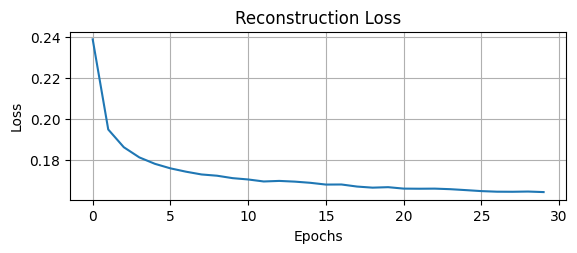

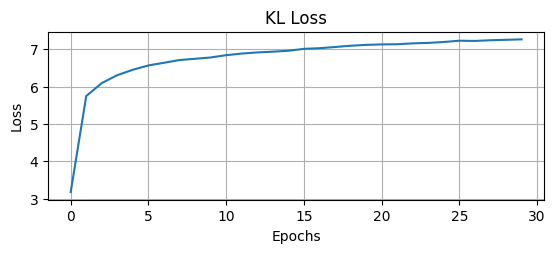

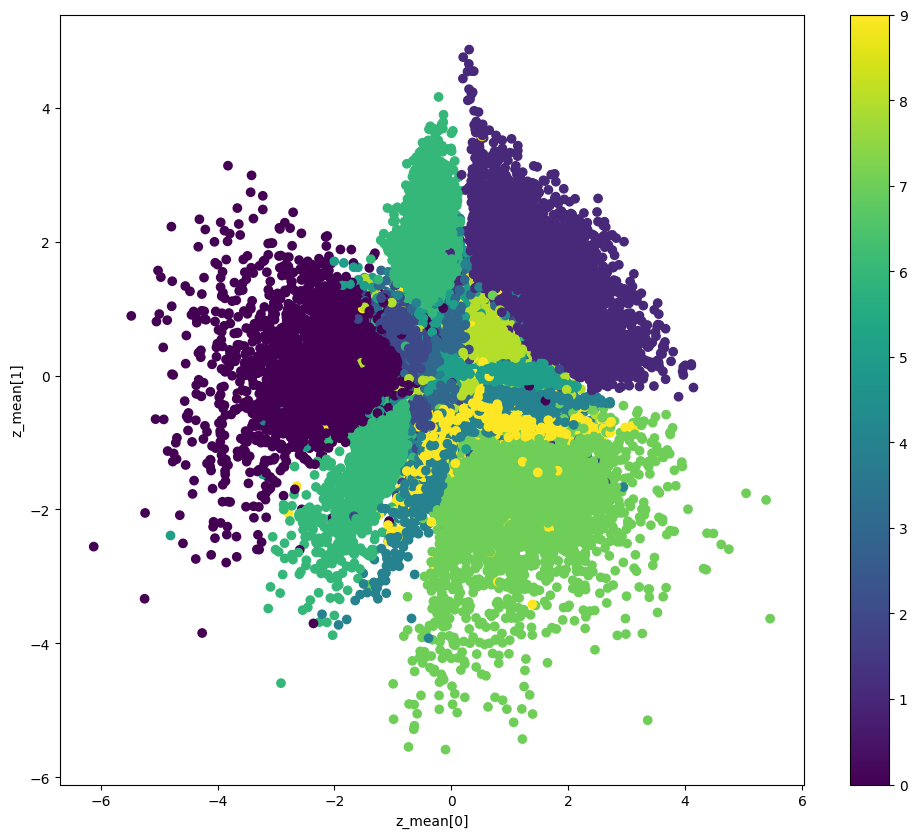

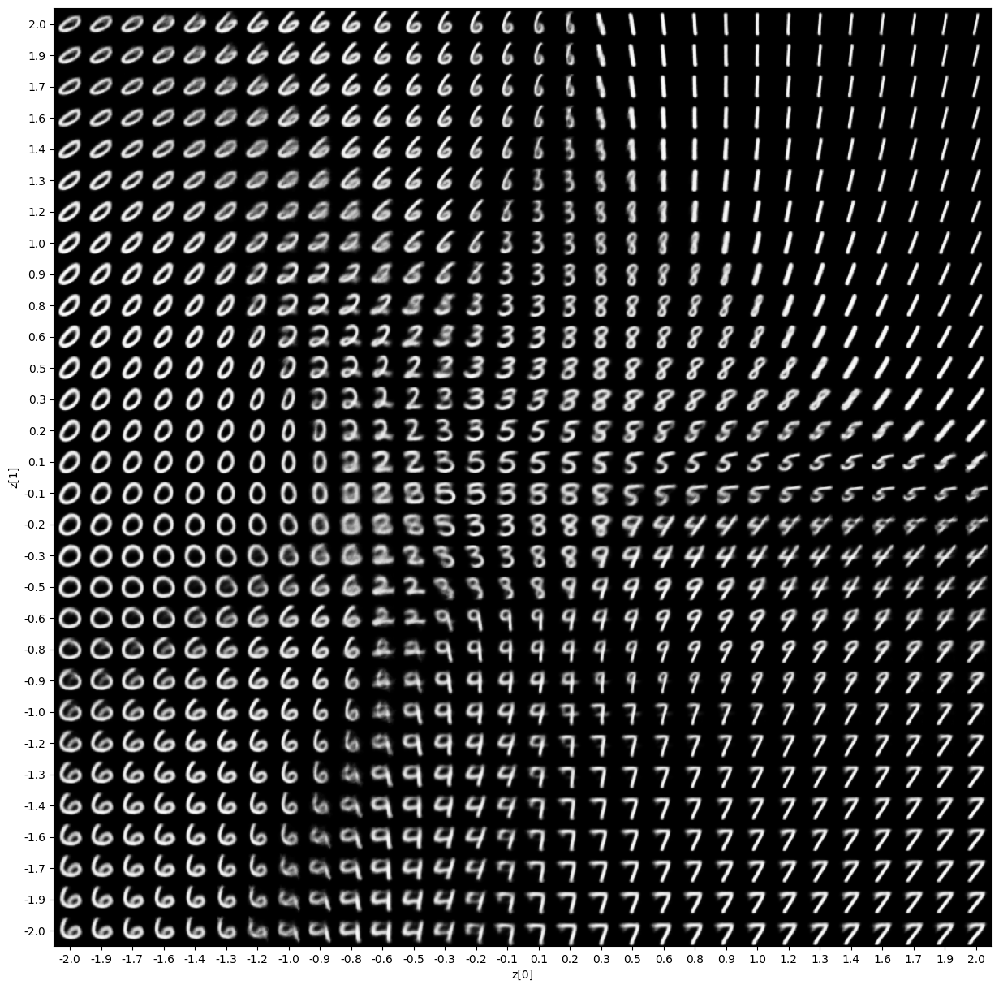

In [ ]:
ENC_LAYERS =  [512, 256, 128]
DEC_LAYERS =  [128, 256, 512]

vae = VAE(input_dim, ENC_LAYERS, latent_dim, DEC_LAYERS, act_fun, last_layer_act_fun).to(device)

optimizer = torch.optim.Adam(vae.parameters(), lr=lr)

start = timer()
loss_train, loss_rec, loss_kl = train(vae, optimizer, dataloader, epochs)
end = timer()
print(f"Training time in second: {(end - start)}")

plot_losses(loss_train, loss_rec, loss_kl)
plot_label_clusters(x_train, y_train)
plot_latent(2.0, 30) 

epoch: 1 -> Loss: 0.24478260 ----- Rec Loss: 0.24163586 ----- Effective KL Loss: 0.00314674
epoch: 2 -> Loss: 0.20618638 ----- Rec Loss: 0.20068431 ----- Effective KL Loss: 0.00550204
epoch: 3 -> Loss: 0.19679394 ----- Rec Loss: 0.19079761 ----- Effective KL Loss: 0.00599633
epoch: 4 -> Loss: 0.19135346 ----- Rec Loss: 0.18511410 ----- Effective KL Loss: 0.00623933
epoch: 5 -> Loss: 0.18772100 ----- Rec Loss: 0.18130228 ----- Effective KL Loss: 0.00641871
epoch: 6 -> Loss: 0.18509211 ----- Rec Loss: 0.17852901 ----- Effective KL Loss: 0.00656317
epoch: 7 -> Loss: 0.18336105 ----- Rec Loss: 0.17672534 ----- Effective KL Loss: 0.00663577
epoch: 8 -> Loss: 0.18189479 ----- Rec Loss: 0.17519358 ----- Effective KL Loss: 0.00670140
epoch: 9 -> Loss: 0.18075192 ----- Rec Loss: 0.17399289 ----- Effective KL Loss: 0.00675914
epoch: 10 -> Loss: 0.17949076 ----- Rec Loss: 0.17268080 ----- Effective KL Loss: 0.00681006
epoch: 11 -> Loss: 0.17864059 ----- Rec Loss: 0.17177974 ----- Effective KL Los

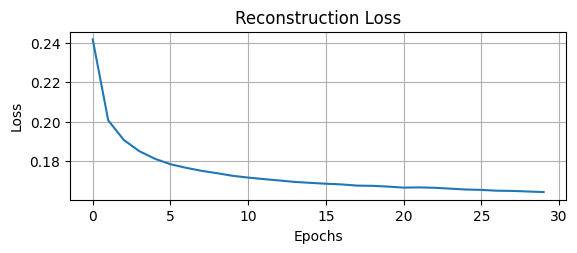

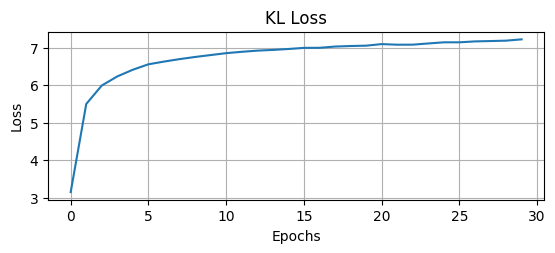

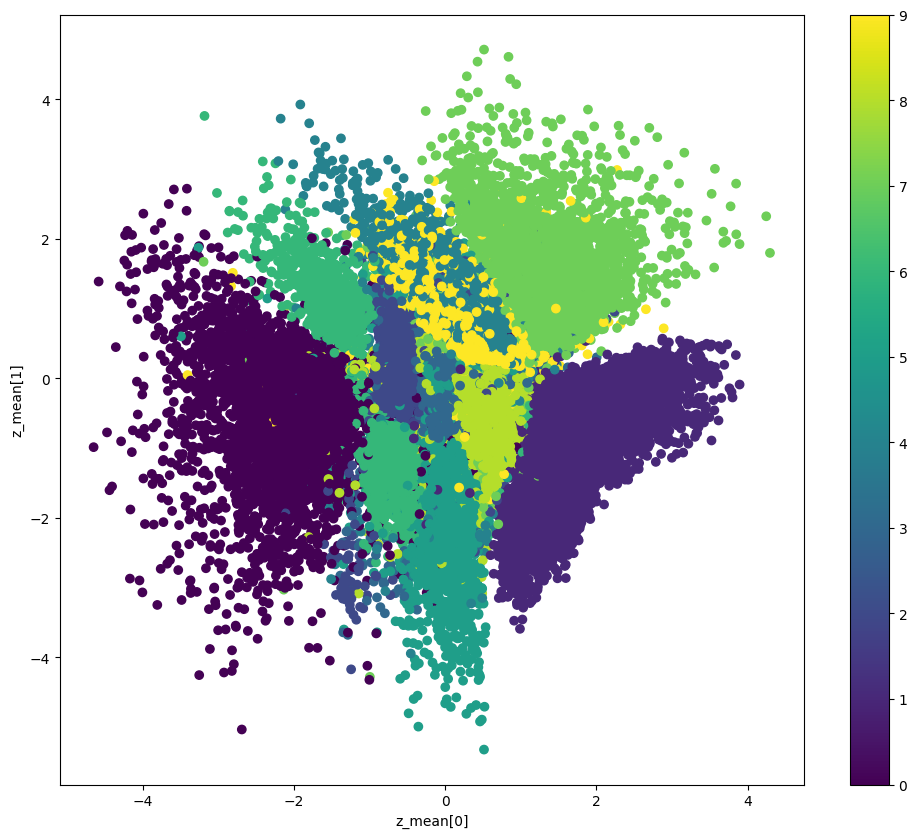

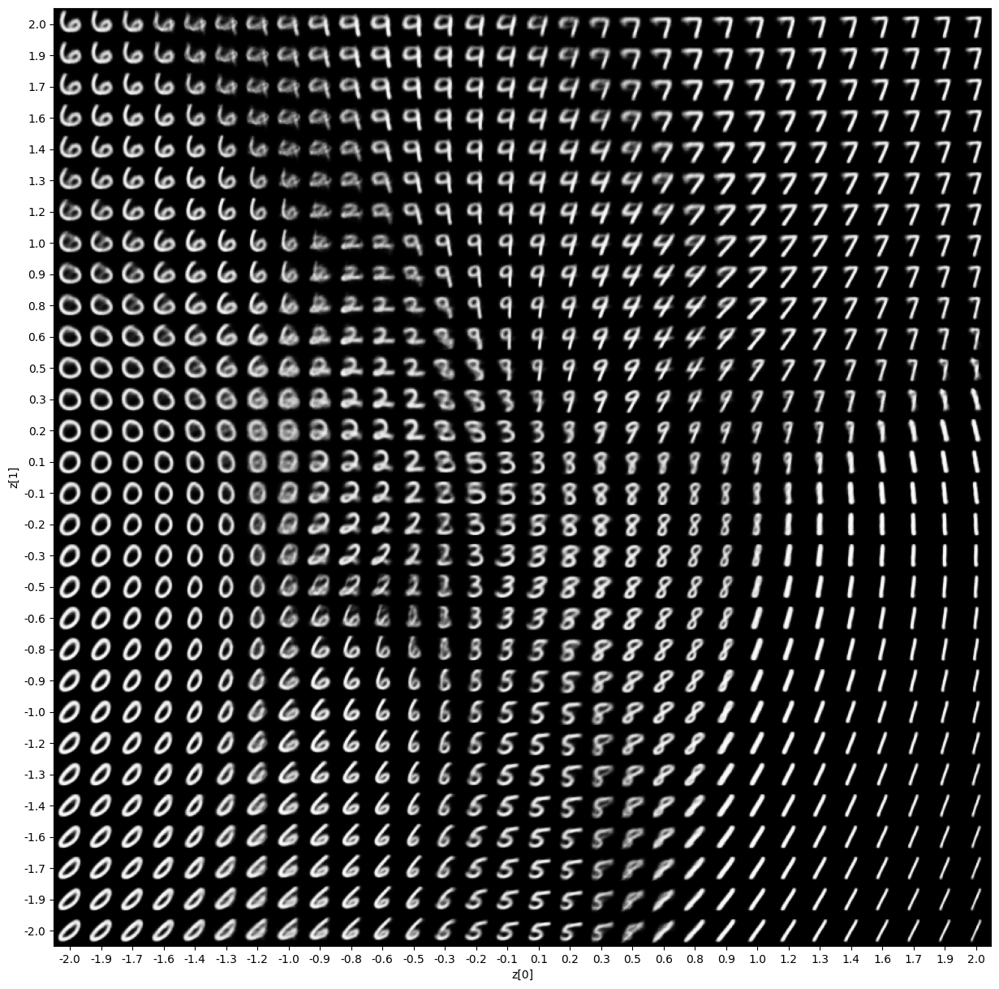

In [ ]:
ENC_LAYERS =  [512, 256, 32]
DEC_LAYERS =  [16, 256, 512]

vae = VAE(input_dim, ENC_LAYERS, latent_dim, DEC_LAYERS, act_fun, last_layer_act_fun).to(device)

optimizer = torch.optim.Adam(vae.parameters(), lr=lr)

start = timer()
loss_train, loss_rec, loss_kl = train(vae, optimizer, dataloader, epochs)
end = timer()
print(f"Training time in second: {(end - start)}")

plot_losses(loss_train, loss_rec, loss_kl)
plot_label_clusters(x_train, y_train)
plot_latent(2.0, 30) 

epoch: 1 -> Loss: 0.24627896 ----- Rec Loss: 0.24303256 ----- Effective KL Loss: 0.00324639
epoch: 2 -> Loss: 0.20558749 ----- Rec Loss: 0.19992386 ----- Effective KL Loss: 0.00566365
epoch: 3 -> Loss: 0.19647902 ----- Rec Loss: 0.19044219 ----- Effective KL Loss: 0.00603686
epoch: 4 -> Loss: 0.19086032 ----- Rec Loss: 0.18452452 ----- Effective KL Loss: 0.00633577
epoch: 5 -> Loss: 0.18787749 ----- Rec Loss: 0.18142194 ----- Effective KL Loss: 0.00645564
epoch: 6 -> Loss: 0.18545516 ----- Rec Loss: 0.17890467 ----- Effective KL Loss: 0.00655063
epoch: 7 -> Loss: 0.18384214 ----- Rec Loss: 0.17717308 ----- Effective KL Loss: 0.00666887
epoch: 8 -> Loss: 0.18253222 ----- Rec Loss: 0.17579025 ----- Effective KL Loss: 0.00674190
epoch: 9 -> Loss: 0.18149206 ----- Rec Loss: 0.17468162 ----- Effective KL Loss: 0.00681044
epoch: 10 -> Loss: 0.18034567 ----- Rec Loss: 0.17345533 ----- Effective KL Loss: 0.00689048
epoch: 11 -> Loss: 0.17965557 ----- Rec Loss: 0.17273495 ----- Effective KL Los

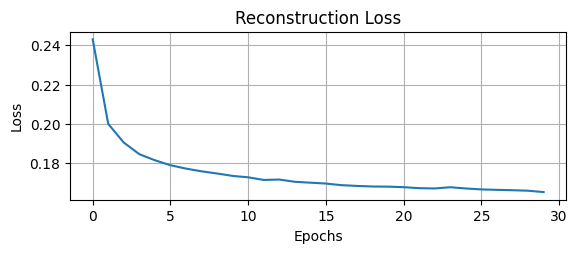

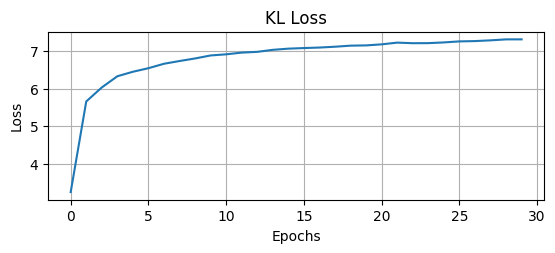

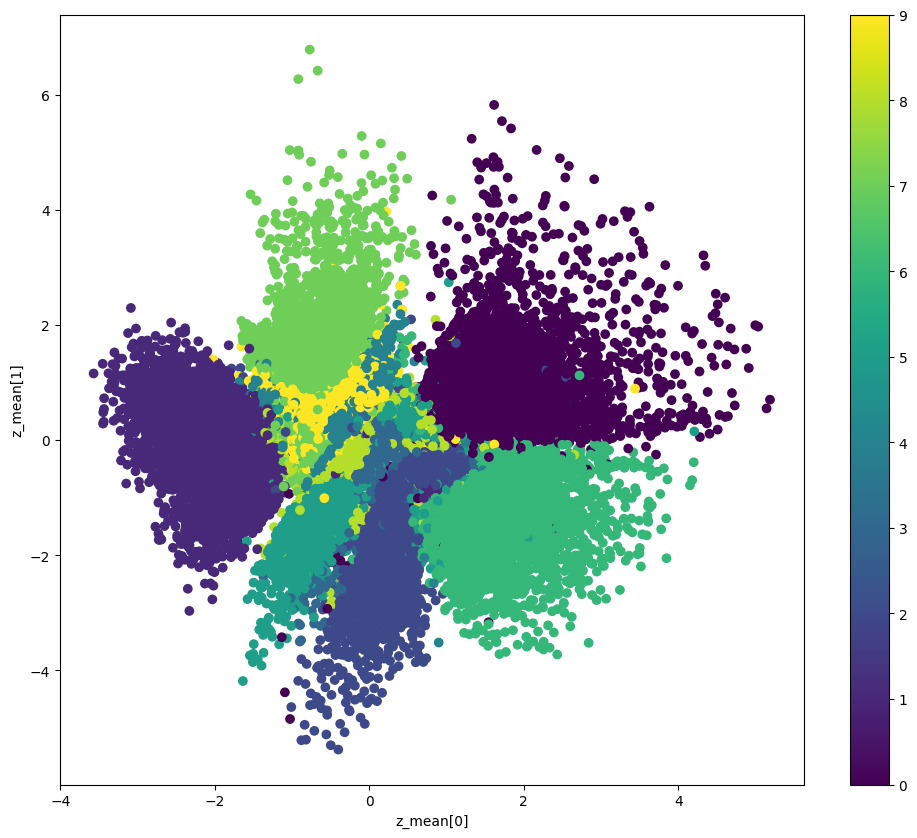

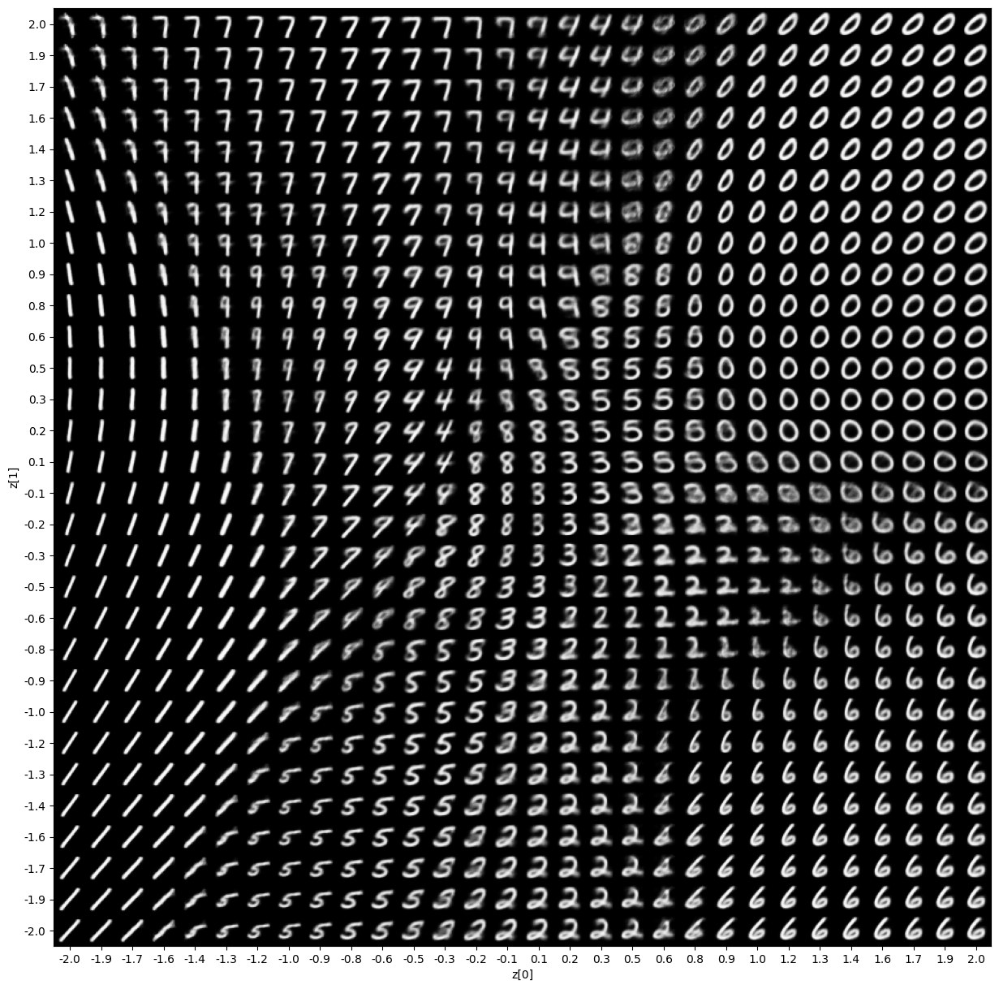

In [ ]:
ENC_LAYERS =  [512, 256, 20]
DEC_LAYERS =  [20, 256, 512]

vae = VAE(input_dim, ENC_LAYERS, latent_dim, DEC_LAYERS, act_fun, last_layer_act_fun).to(device)

optimizer = torch.optim.Adam(vae.parameters(), lr=lr)

start = timer()
loss_train, loss_rec, loss_kl = train(vae, optimizer, dataloader, epochs)
end = timer()
print(f"Training time in second: {(end - start)}")

plot_losses(loss_train, loss_rec, loss_kl)
plot_label_clusters(x_train, y_train)
plot_latent(2.0, 30) 

epoch: 1 -> Loss: 0.25045234 ----- Rec Loss: 0.24757428 ----- Effective KL Loss: 0.00287804
epoch: 2 -> Loss: 0.20731114 ----- Rec Loss: 0.20191512 ----- Effective KL Loss: 0.00539609
epoch: 3 -> Loss: 0.19713914 ----- Rec Loss: 0.19120079 ----- Effective KL Loss: 0.00593853
epoch: 4 -> Loss: 0.19144398 ----- Rec Loss: 0.18522725 ----- Effective KL Loss: 0.00621664
epoch: 5 -> Loss: 0.18770841 ----- Rec Loss: 0.18130529 ----- Effective KL Loss: 0.00640311
epoch: 6 -> Loss: 0.18558639 ----- Rec Loss: 0.17903954 ----- Effective KL Loss: 0.00654681
epoch: 7 -> Loss: 0.18357922 ----- Rec Loss: 0.17693070 ----- Effective KL Loss: 0.00664878
epoch: 8 -> Loss: 0.18234143 ----- Rec Loss: 0.17561860 ----- Effective KL Loss: 0.00672280
epoch: 9 -> Loss: 0.18090147 ----- Rec Loss: 0.17408940 ----- Effective KL Loss: 0.00681202
epoch: 10 -> Loss: 0.18014517 ----- Rec Loss: 0.17329466 ----- Effective KL Loss: 0.00685045
epoch: 11 -> Loss: 0.17937870 ----- Rec Loss: 0.17249499 ----- Effective KL Los

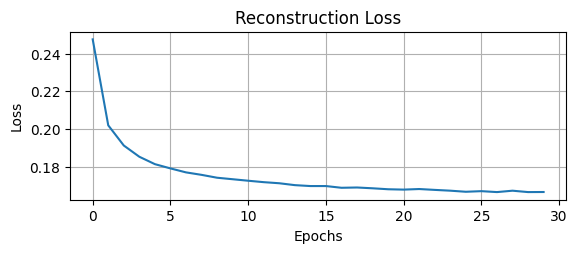

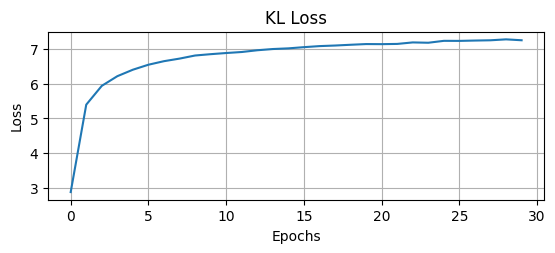

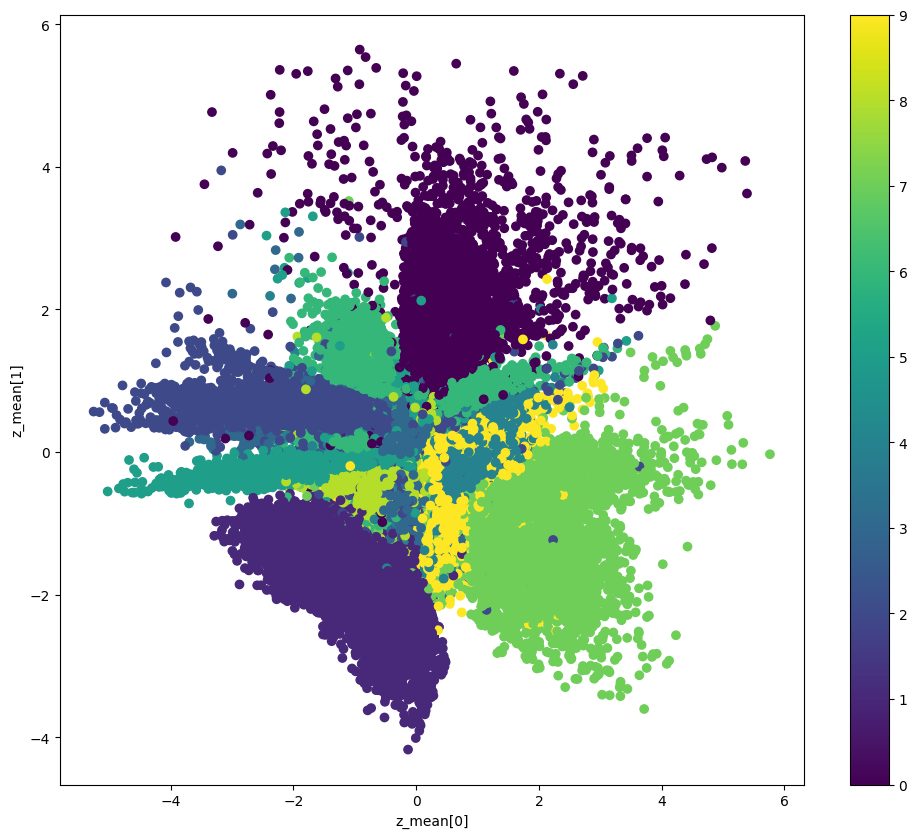

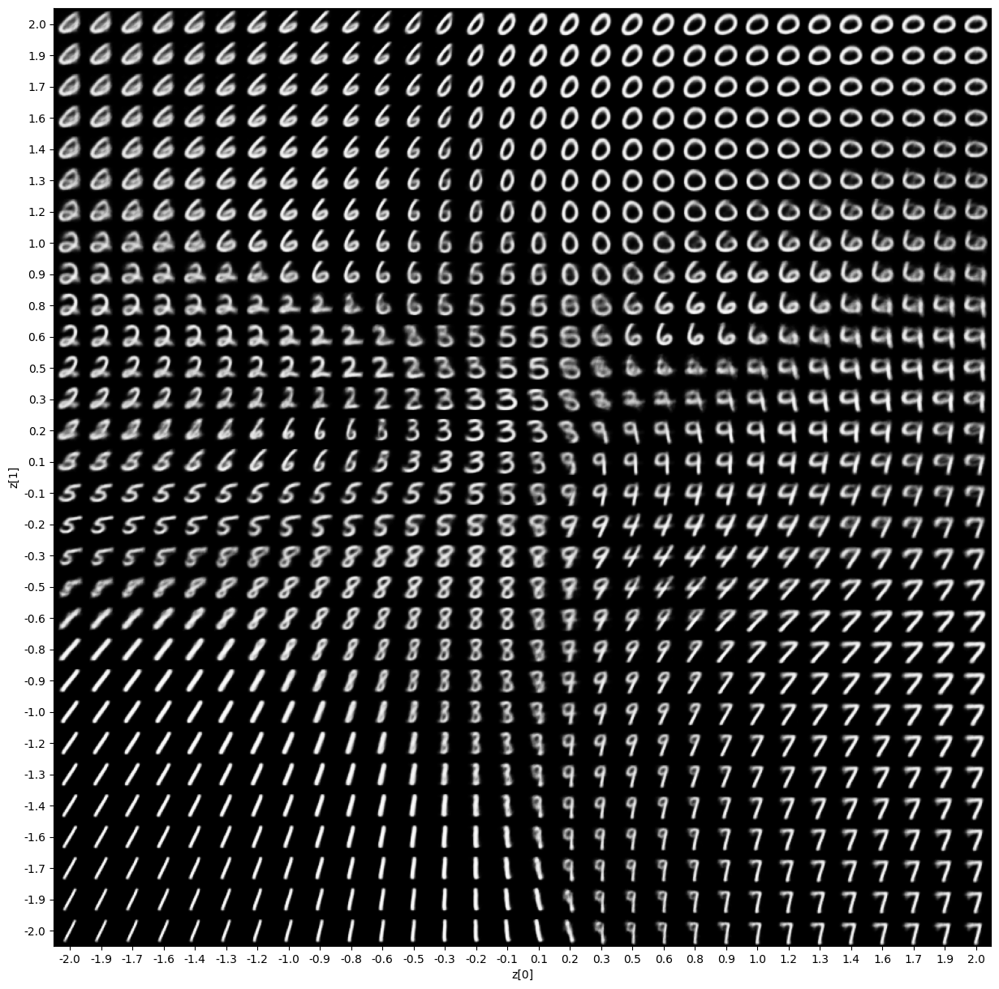

In [ ]:
ENC_LAYERS =  [512, 128, 64]
DEC_LAYERS =  [64, 128, 512]

vae = VAE(input_dim, ENC_LAYERS, latent_dim, DEC_LAYERS, act_fun, last_layer_act_fun).to(device)

optimizer = torch.optim.Adam(vae.parameters(), lr=lr)

start = timer()
loss_train, loss_rec, loss_kl = train(vae, optimizer, dataloader, epochs)
end = timer()
print(f"Training time in second: {(end - start)}")

plot_losses(loss_train, loss_rec, loss_kl)
plot_label_clusters(x_train, y_train)
plot_latent(2.0, 30) 

epoch: 1 -> Loss: 0.25263977 ----- Rec Loss: 0.24936530 ----- Effective KL Loss: 0.00327440
epoch: 2 -> Loss: 0.21028344 ----- Rec Loss: 0.20487776 ----- Effective KL Loss: 0.00540578
epoch: 3 -> Loss: 0.20116973 ----- Rec Loss: 0.19542339 ----- Effective KL Loss: 0.00574646
epoch: 4 -> Loss: 0.19697334 ----- Rec Loss: 0.19108886 ----- Effective KL Loss: 0.00588458
epoch: 5 -> Loss: 0.19333193 ----- Rec Loss: 0.18726805 ----- Effective KL Loss: 0.00606389
epoch: 6 -> Loss: 0.19104698 ----- Rec Loss: 0.18485795 ----- Effective KL Loss: 0.00618910
epoch: 7 -> Loss: 0.18939686 ----- Rec Loss: 0.18308586 ----- Effective KL Loss: 0.00631096
epoch: 8 -> Loss: 0.18762214 ----- Rec Loss: 0.18122381 ----- Effective KL Loss: 0.00639832
epoch: 9 -> Loss: 0.18592976 ----- Rec Loss: 0.17947854 ----- Effective KL Loss: 0.00645127
epoch: 10 -> Loss: 0.18529779 ----- Rec Loss: 0.17878447 ----- Effective KL Loss: 0.00651339
epoch: 11 -> Loss: 0.18434560 ----- Rec Loss: 0.17779739 ----- Effective KL Los

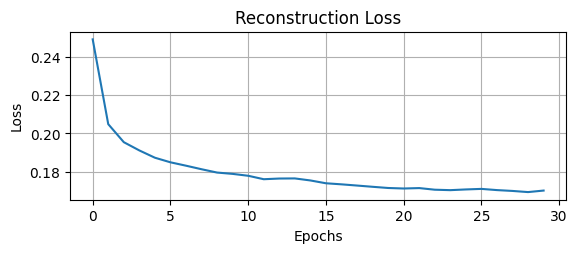

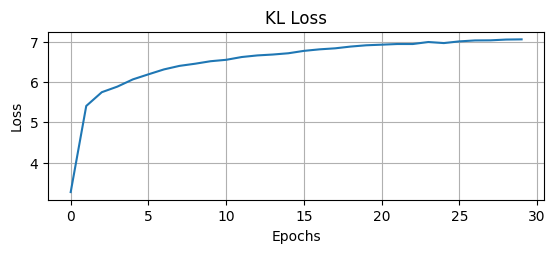

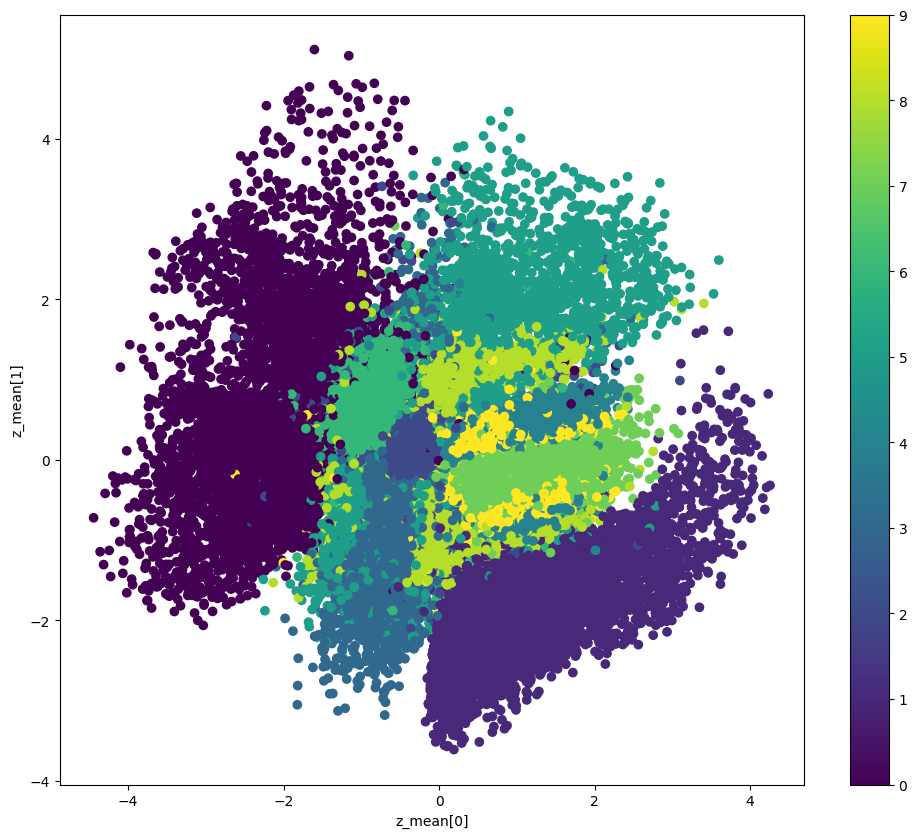

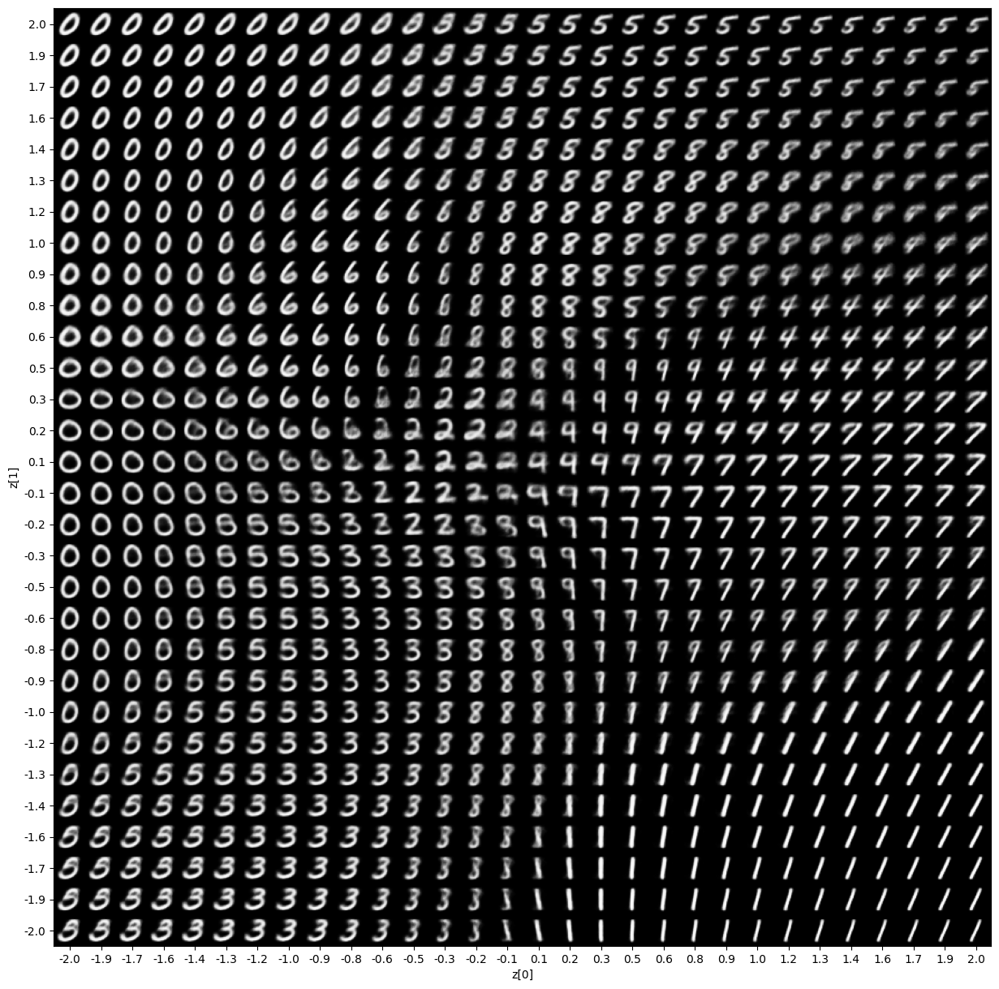

In [ ]:
ENC_LAYERS =  [256, 128, 32]
DEC_LAYERS =  [32, 128, 256]

vae = VAE(input_dim, ENC_LAYERS, latent_dim, DEC_LAYERS, act_fun, last_layer_act_fun).to(device)

optimizer = torch.optim.Adam(vae.parameters(), lr=lr)

start = timer()
loss_train, loss_rec, loss_kl = train(vae, optimizer, dataloader, epochs)
end = timer()
print(f"Training time in second: {(end - start)}")

plot_losses(loss_train, loss_rec, loss_kl)
plot_label_clusters(x_train, y_train)
plot_latent(2.0, 30) 

epoch: 1 -> Loss: 0.26869446 ----- Rec Loss: 0.26644981 ----- Effective KL Loss: 0.00224442
epoch: 2 -> Loss: 0.22188939 ----- Rec Loss: 0.21727729 ----- Effective KL Loss: 0.00461201
epoch: 3 -> Loss: 0.20993410 ----- Rec Loss: 0.20469405 ----- Effective KL Loss: 0.00524002
epoch: 4 -> Loss: 0.20413521 ----- Rec Loss: 0.19861007 ----- Effective KL Loss: 0.00552502
epoch: 5 -> Loss: 0.19951290 ----- Rec Loss: 0.19375858 ----- Effective KL Loss: 0.00575428
epoch: 6 -> Loss: 0.19628035 ----- Rec Loss: 0.19036286 ----- Effective KL Loss: 0.00591764
epoch: 7 -> Loss: 0.19388328 ----- Rec Loss: 0.18783191 ----- Effective KL Loss: 0.00605135
epoch: 8 -> Loss: 0.19164939 ----- Rec Loss: 0.18548761 ----- Effective KL Loss: 0.00616173
epoch: 9 -> Loss: 0.18994984 ----- Rec Loss: 0.18367396 ----- Effective KL Loss: 0.00627593
epoch: 10 -> Loss: 0.18835583 ----- Rec Loss: 0.18198039 ----- Effective KL Loss: 0.00637536
epoch: 11 -> Loss: 0.18707441 ----- Rec Loss: 0.18065384 ----- Effective KL Los

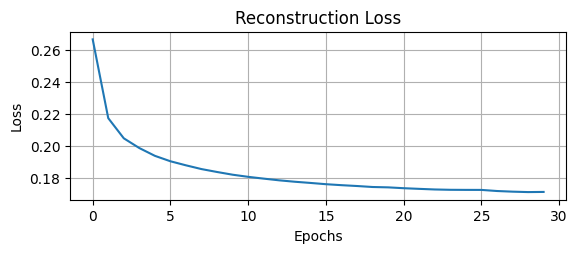

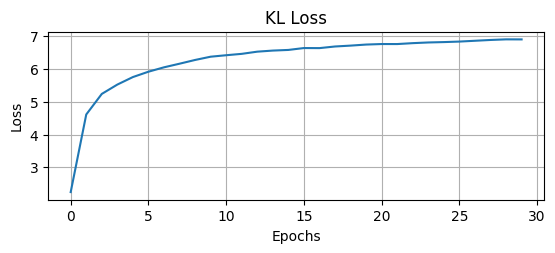

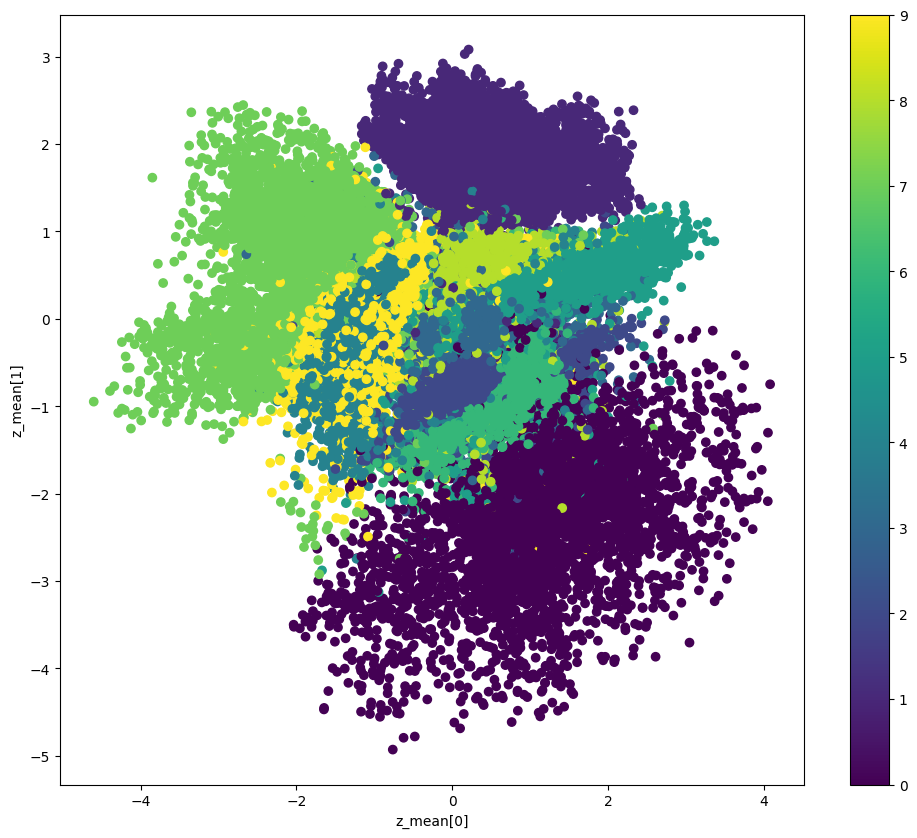

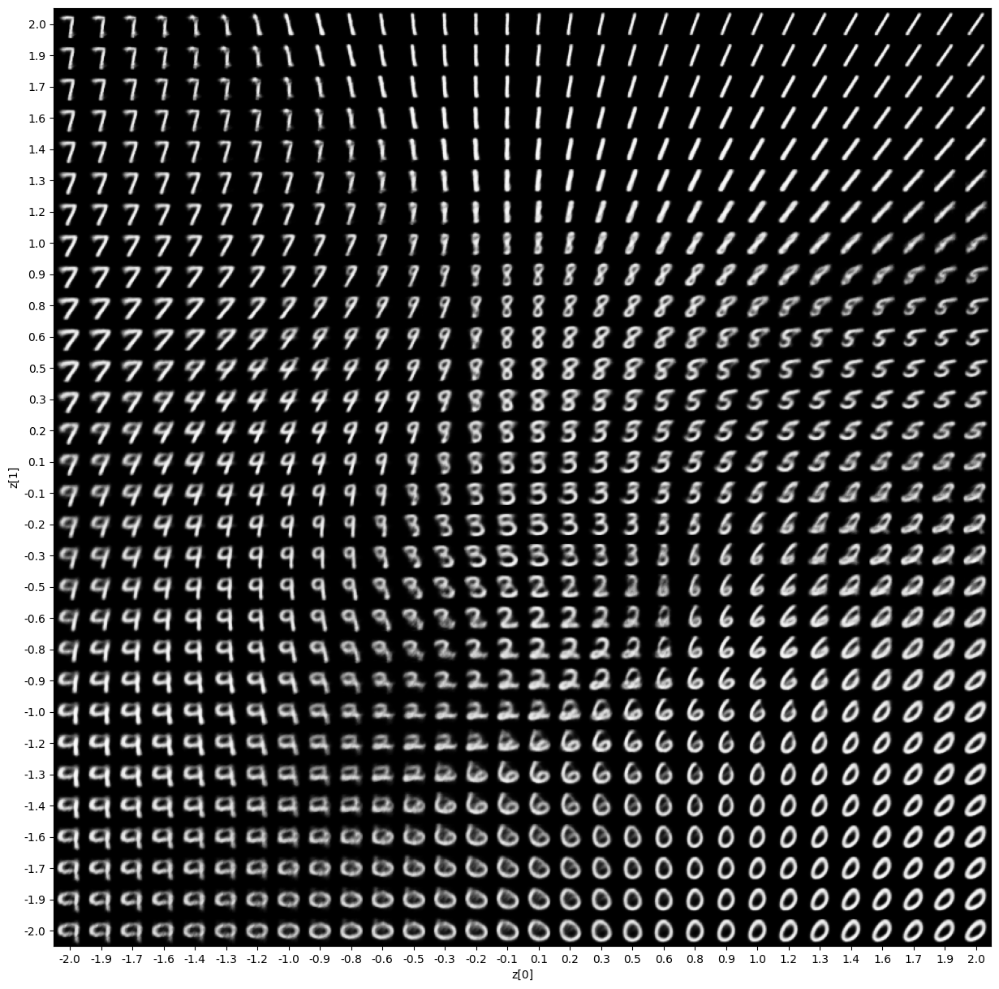

In [ ]:
ENC_LAYERS =  [128, 64, 32]
DEC_LAYERS =  [32, 64, 128]

vae = VAE(input_dim, ENC_LAYERS, latent_dim, DEC_LAYERS, act_fun, last_layer_act_fun).to(device)

optimizer = torch.optim.Adam(vae.parameters(), lr=lr)

start = timer()
loss_train, loss_rec, loss_kl = train(vae, optimizer, dataloader, epochs)
end = timer()
print(f"Training time in second: {(end - start)}")

plot_losses(loss_train, loss_rec, loss_kl)
plot_label_clusters(x_train, y_train)
plot_latent(2.0, 30) 

epoch: 1 -> Loss: 0.24164942 ----- Rec Loss: 0.23754160 ----- Effective KL Loss: 0.00410766
epoch: 2 -> Loss: 0.20829779 ----- Rec Loss: 0.20288068 ----- Effective KL Loss: 0.00541710
epoch: 3 -> Loss: 0.20118278 ----- Rec Loss: 0.19544859 ----- Effective KL Loss: 0.00573415
epoch: 4 -> Loss: 0.19609652 ----- Rec Loss: 0.19010252 ----- Effective KL Loss: 0.00599407
epoch: 5 -> Loss: 0.19265817 ----- Rec Loss: 0.18646152 ----- Effective KL Loss: 0.00619665
epoch: 6 -> Loss: 0.19010474 ----- Rec Loss: 0.18381490 ----- Effective KL Loss: 0.00628977
epoch: 7 -> Loss: 0.18813345 ----- Rec Loss: 0.18176633 ----- Effective KL Loss: 0.00636715
epoch: 8 -> Loss: 0.18652354 ----- Rec Loss: 0.18005963 ----- Effective KL Loss: 0.00646400
epoch: 9 -> Loss: 0.18532978 ----- Rec Loss: 0.17881072 ----- Effective KL Loss: 0.00651906
epoch: 10 -> Loss: 0.18427204 ----- Rec Loss: 0.17774366 ----- Effective KL Loss: 0.00652824
epoch: 11 -> Loss: 0.18355694 ----- Rec Loss: 0.17697226 ----- Effective KL Los

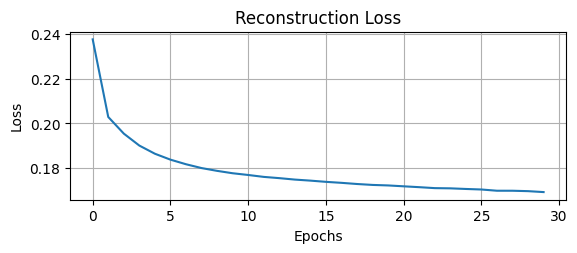

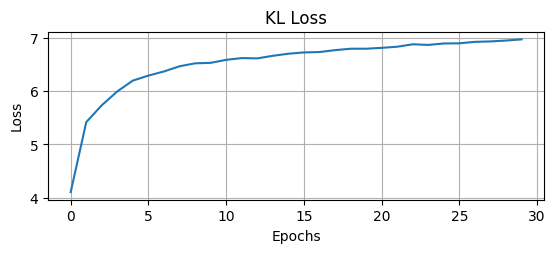

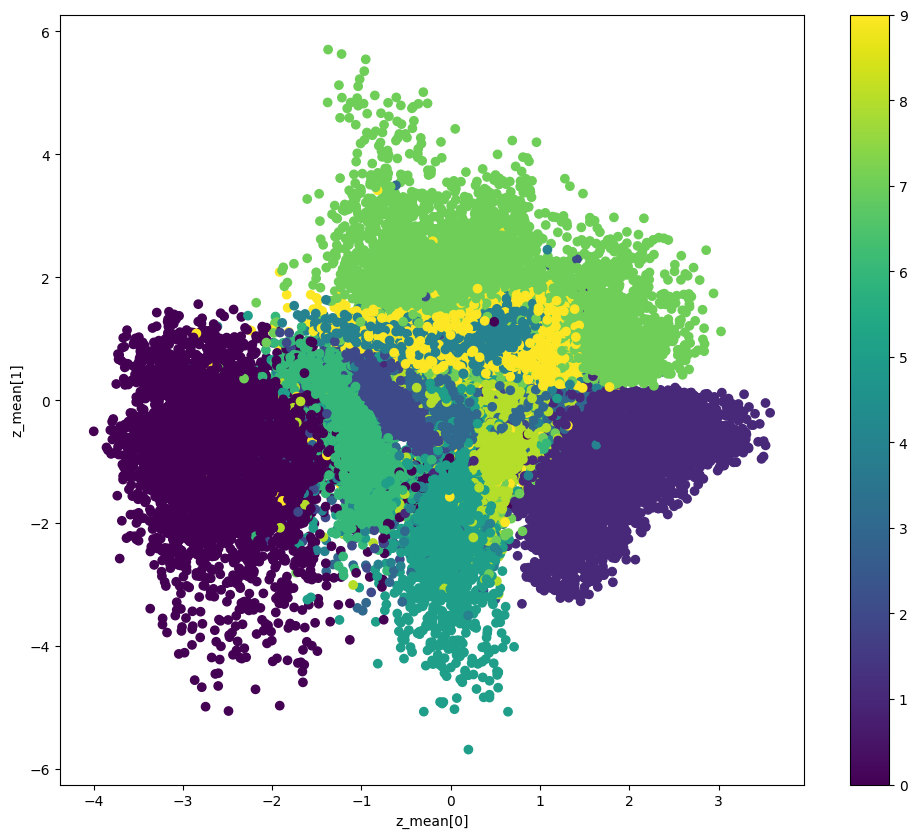

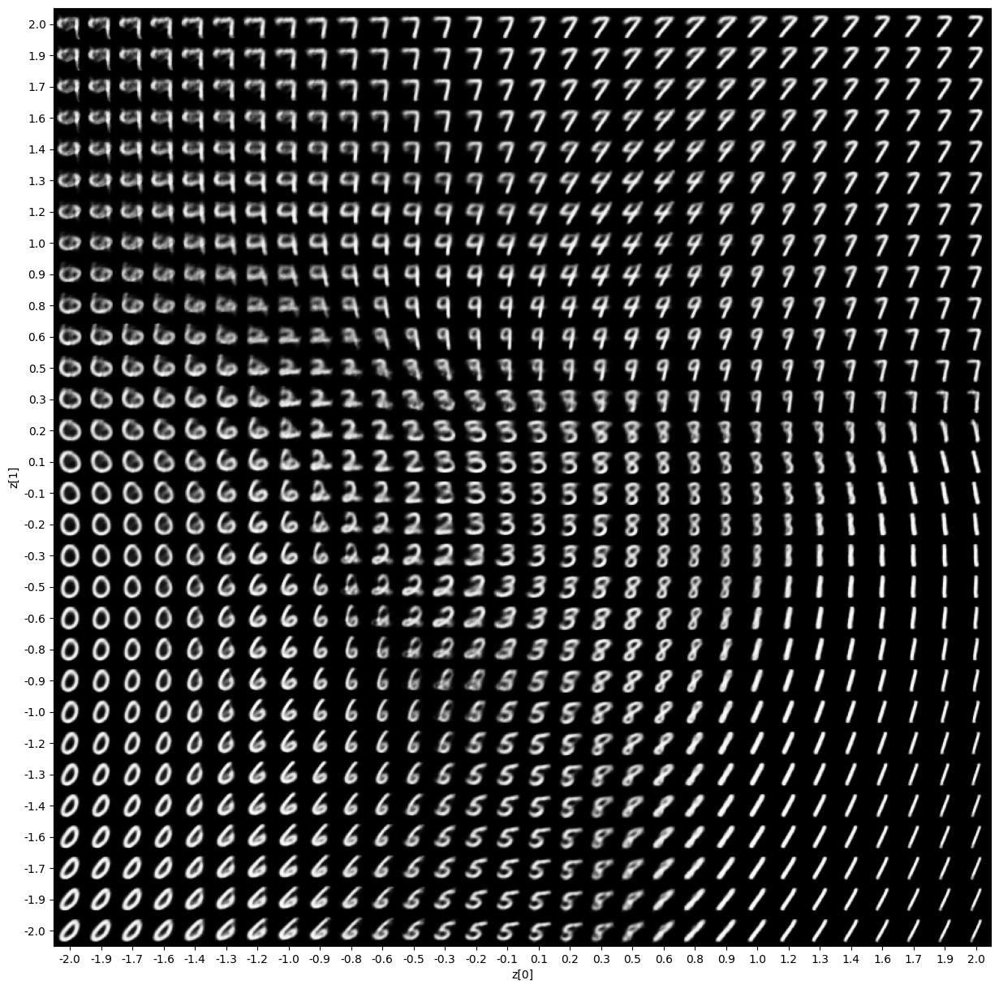

In [ ]:
ENC_LAYERS =  [256, 128]
DEC_LAYERS =  [128, 256]

vae = VAE(input_dim, ENC_LAYERS, latent_dim, DEC_LAYERS, act_fun, last_layer_act_fun).to(device)

optimizer = torch.optim.Adam(vae.parameters(), lr=lr)

start = timer()
loss_train, loss_rec, loss_kl = train(vae, optimizer, dataloader, epochs)
end = timer()
print(f"Training time in second: {(end - start)}")

plot_losses(loss_train, loss_rec, loss_kl)
plot_label_clusters(x_train, y_train)
plot_latent(2.0, 30) 

epoch: 1 -> Loss: 0.23141828 ----- Rec Loss: 0.22698973 ----- Effective KL Loss: 0.00442870
epoch: 2 -> Loss: 0.20182019 ----- Rec Loss: 0.19600730 ----- Effective KL Loss: 0.00581288
epoch: 3 -> Loss: 0.19466887 ----- Rec Loss: 0.18851526 ----- Effective KL Loss: 0.00615370
epoch: 4 -> Loss: 0.19059199 ----- Rec Loss: 0.18425015 ----- Effective KL Loss: 0.00634182
epoch: 5 -> Loss: 0.18764719 ----- Rec Loss: 0.18117203 ----- Effective KL Loss: 0.00647522
epoch: 6 -> Loss: 0.18569528 ----- Rec Loss: 0.17917390 ----- Effective KL Loss: 0.00652136
epoch: 7 -> Loss: 0.18396707 ----- Rec Loss: 0.17734632 ----- Effective KL Loss: 0.00662081
epoch: 8 -> Loss: 0.18265548 ----- Rec Loss: 0.17599401 ----- Effective KL Loss: 0.00666156
epoch: 9 -> Loss: 0.18158425 ----- Rec Loss: 0.17484125 ----- Effective KL Loss: 0.00674308
epoch: 10 -> Loss: 0.18065073 ----- Rec Loss: 0.17387846 ----- Effective KL Loss: 0.00677236
epoch: 11 -> Loss: 0.17988373 ----- Rec Loss: 0.17307608 ----- Effective KL Los

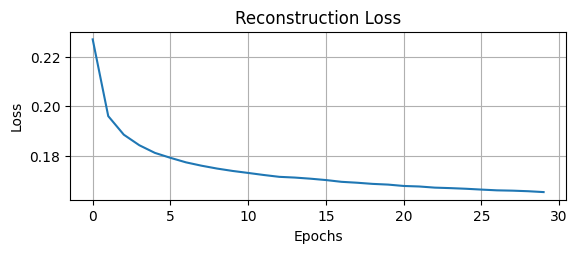

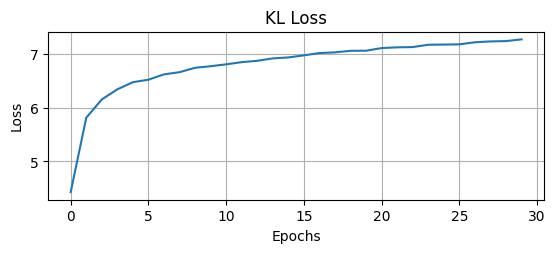

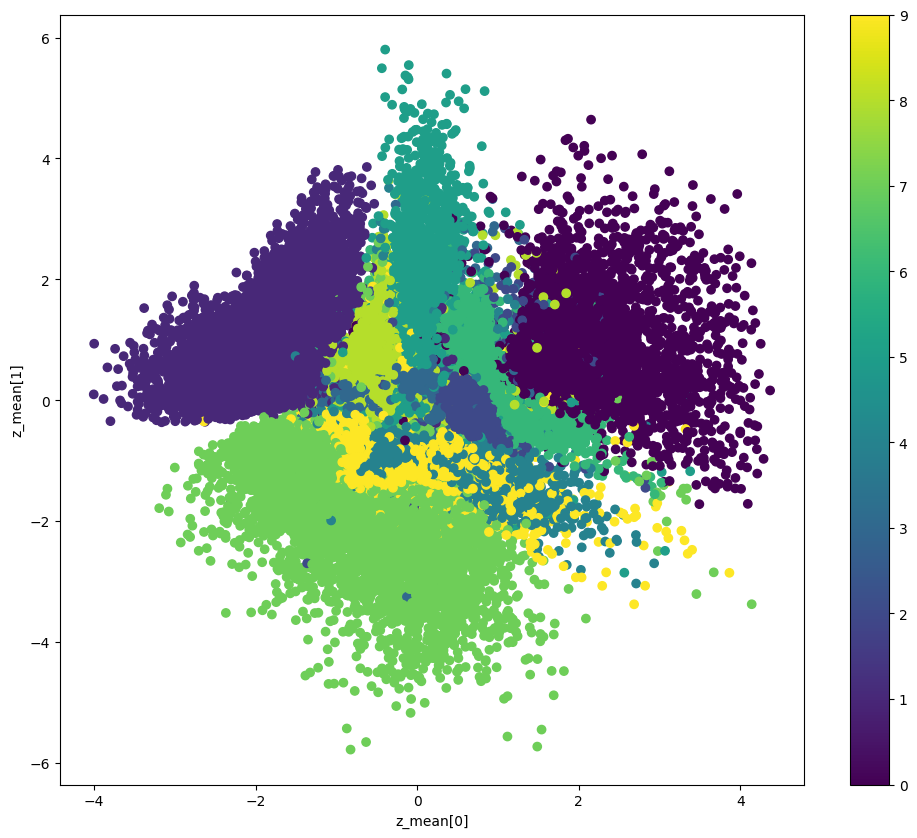

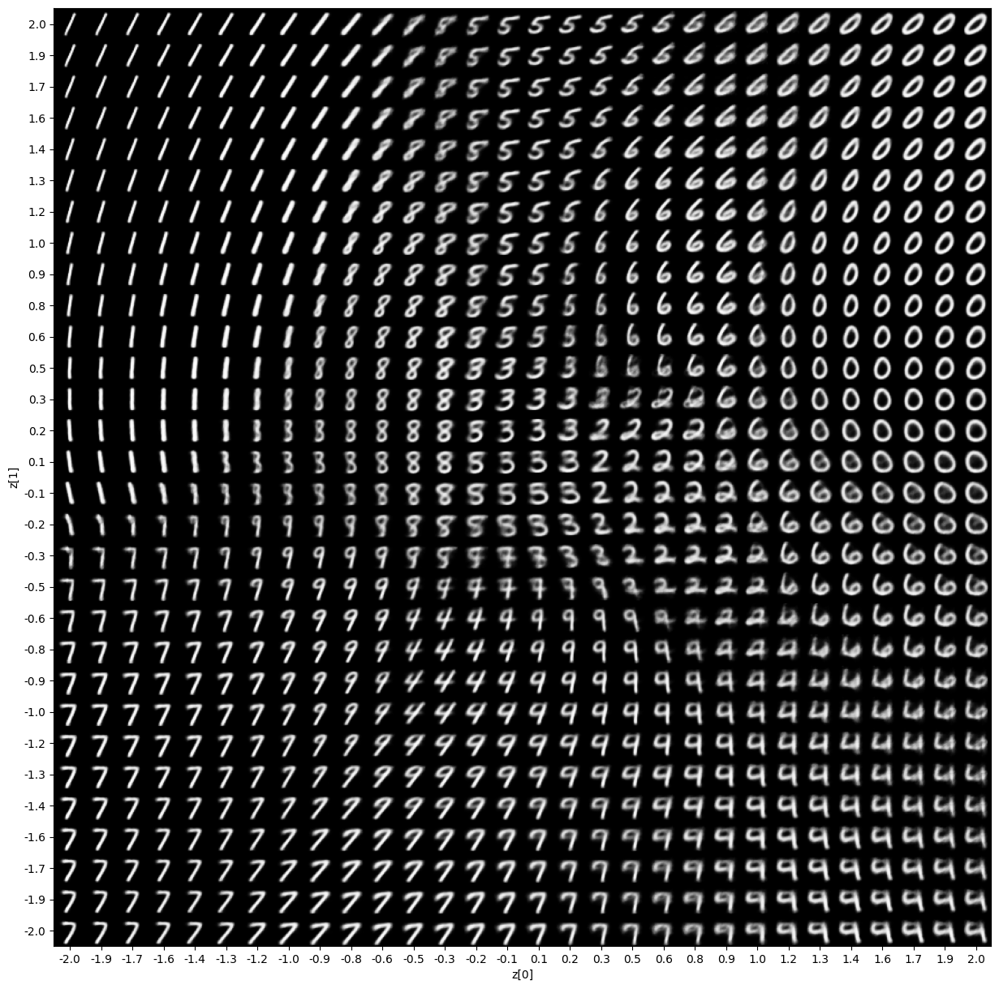

In [ ]:
ENC_LAYERS =  [512, 256]
DEC_LAYERS =  [256, 512]

vae = VAE(input_dim, ENC_LAYERS, latent_dim, DEC_LAYERS, act_fun, last_layer_act_fun).to(device)

optimizer = torch.optim.Adam(vae.parameters(), lr=lr)

start = timer()
loss_train, loss_rec, loss_kl = train(vae, optimizer, dataloader, epochs)
end = timer()
print(f"Training time in second: {(end - start)}")

plot_losses(loss_train, loss_rec, loss_kl)
plot_label_clusters(x_train, y_train)
plot_latent(2.0, 30) 